In [1]:
# Necessary imports
import nltk, re, pandas as pd, xml, os, sklearn, string, numpy as np, time, pickle, gc as gc, warnings
import seaborn as sns, matplotlib.pyplot as plt, plotly.express as px, plotly.offline as plotly_offline
from nltk.corpus import stopwords
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split, cross_validate, StratifiedShuffleSplit, cross_val_score
from sklearn.naive_bayes import GaussianNB, MultinomialNB, ComplementNB, BernoulliNB, CategoricalNB
from nltk.stem.snowball import SnowballStemmer

# Data Scaling / Normalization
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import MinMaxScaler

# Custom Library
from research_utils import *
from statistics_utils import *

# Normality Test Imports
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from scipy.stats import shapiro, normaltest, anderson

# Other settings
gc.enable()
warnings.filterwarnings("ignore")
plotly_offline.init_notebook_mode(connected = True)

# Global folds to use for K-CFV and simulations to run

global k_folds, simulations
k_folds = 5
simulations = 10

In [2]:
def run_classifiers(sims, folds, dfs, classes, names):
    # Test some basic classifiers
    classifiers = [GaussianNB(), MultinomialNB(), BernoulliNB(), CategoricalNB(), ComplementNB()]

    # Run a given number of simulations
    for n in range(sims):
        # Loop through each of the datasets
        for i in range(len(dfs)):
            print("*--------------------------------------------*")
            # Copy the dataset
            temp = dfs[i].copy()

            # Try each classifier
            for clf in classifiers:
                # Take the classifiers name
                name = str(clf.__class__.__name__)
                try:  
                    # Utilize a shuffle split for the cross validation
                    cv = StratifiedShuffleSplit(n_splits = folds, test_size = 0.33, random_state=np.random.randint(1,100))
                    # Capture the best, worst, and average across the splits
                    best = round(max(cross_val_score(clf, temp, classes, cv=cv)), 5)
                    worst = round(min(cross_val_score(clf, temp, classes, cv=cv)), 5)
                    avg = round((sum(cross_val_score(clf, temp, classes, cv=cv)) / len(cross_val_score(clf, temp, classes, cv=cv))), 5)
                    # Print out results
                    print("Simulation: {} | Data: {} | Classifier: {} | Best: {} | Worst: {} | Average: {}".format(n+1, names[i], name, best, worst, avg))
                except:
                    # Alert if any error
                    print("Error Calculating: {}".format(name))
            
            # Delete temp df
            del(temp)

## Frequency Analysis

In [3]:
# Load Amazon data
df = pd.read_csv('Amazon Reviews.csv')

# Create parsed dataframes and their types
dfs, names, classes = create_amazon_dataframes(df, True, 'Rating')

boolean = dfs[0]
tfidf = dfs[1]
freq = dfs[2]

In [4]:
print(list(set(classes)))

[0.0, 1.0]


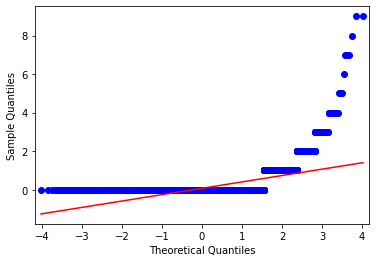

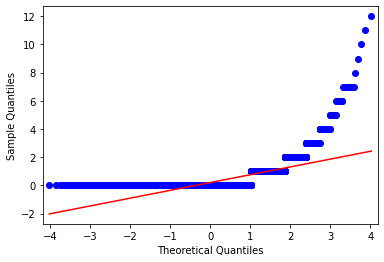

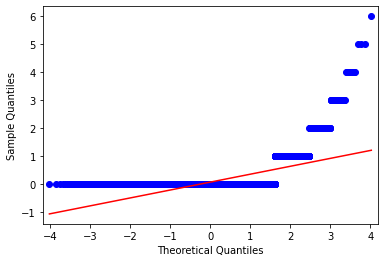

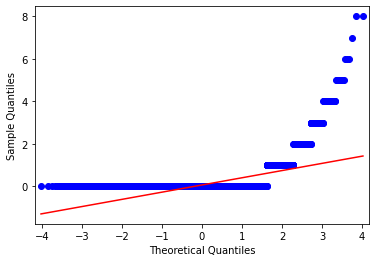

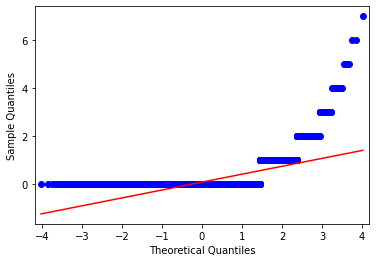

...

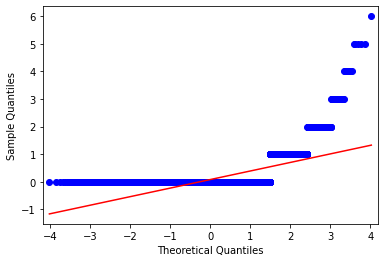

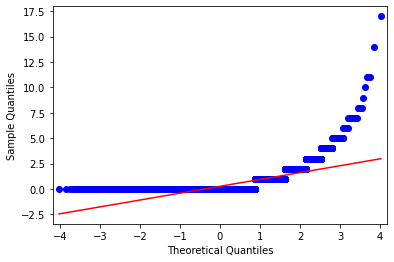

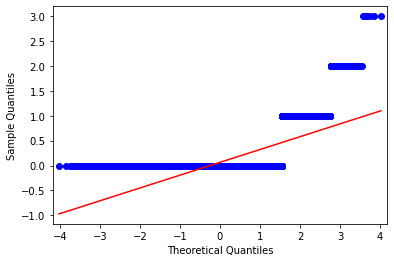

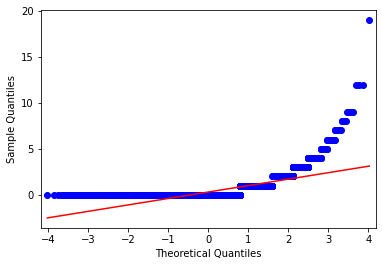

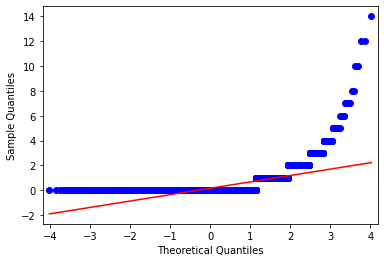

In [5]:
df_qq_plot(freq)

In [6]:
col_ratio, average_p, average_stat = shapiro_wilk(freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 0.3036


In [7]:
col_ratio, average_p, average_stat = dagastino(freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 37689.9465


In [8]:
col_ratio, average_sig, average_critical = anderson_darling_test(freq, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average Significant Value: {}".format(round(average_sig, 4)))
print("Average Critical Value: {}".format(round(average_critical, 4)))

0.0% of columns are normally distributed
Average Significant Value: 6.7
Average Critical Value: 0.8058


In [9]:
run_classifiers(simulations, k_folds, [freq], classes,["Frequency"])

*--------------------------------------------*
Simulation: 1 | Data: Frequency | Classifier: GaussianNB | Best: 0.71471 | Worst: 0.70926 | Average: 0.71149
Simulation: 1 | Data: Frequency | Classifier: MultinomialNB | Best: 0.74947 | Worst: 0.73539 | Average: 0.74169
Simulation: 1 | Data: Frequency | Classifier: BernoulliNB | Best: 0.73434 | Worst: 0.72404 | Average: 0.7283
Error Calculating: CategoricalNB
Simulation: 1 | Data: Frequency | Classifier: ComplementNB | Best: 0.7419 | Worst: 0.72633 | Average: 0.73545
*--------------------------------------------*
Simulation: 2 | Data: Frequency | Classifier: GaussianNB | Best: 0.7119 | Worst: 0.70644 | Average: 0.70889
Simulation: 2 | Data: Frequency | Classifier: MultinomialNB | Best: 0.74261 | Worst: 0.7361 | Average: 0.739
Simulation: 2 | Data: Frequency | Classifier: BernoulliNB | Best: 0.7346 | Worst: 0.72554 | Average: 0.73085
Error Calculating: CategoricalNB
Simulation: 2 | Data: Frequency | Classifier: ComplementNB | Best: 0.7441 

## Frequency Analysis - QuantileTransformed Data

In [10]:
# Load Amazon data
qt_df = pd.read_csv('Amazon Reviews.csv')

# Create parsed dataframes and their types
qt_dfs, qt_names, qt_classes = create_amazon_dataframes(qt_df, True, 'Rating')

qt_boolean = qt_dfs[0]
qt_tfidf = qt_dfs[1]
qt_freq = qt_dfs[2]

In [11]:
print(list(set(list(qt_classes))))

[0.0, 1.0]


In [12]:
# Try to make it normal?
qt = QuantileTransformer(output_distribution='normal')
transformed_freq = qt.fit_transform(qt_freq)

transformed_freq = pd.DataFrame(data=transformed_freq, columns=freq.columns)

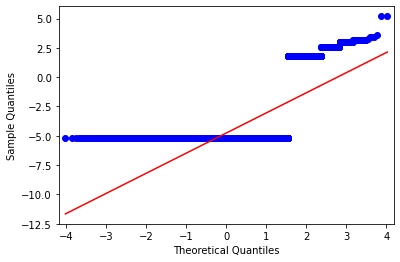

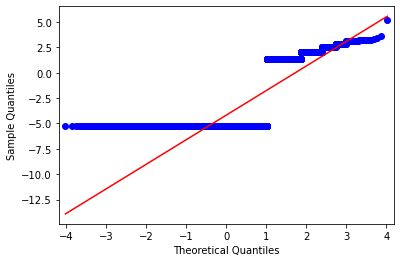

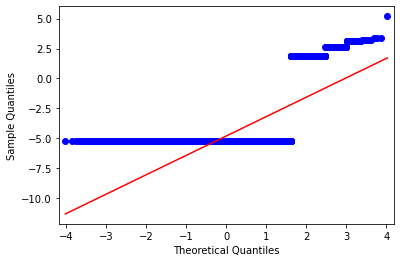

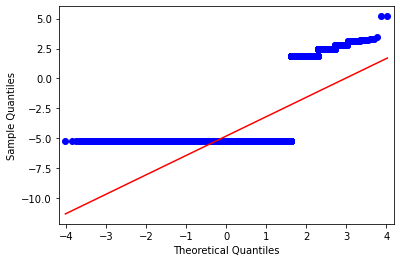

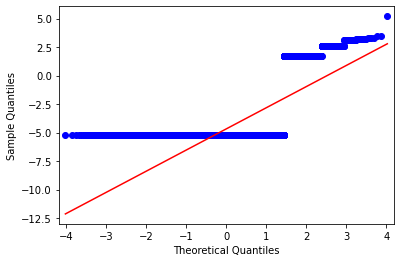

...

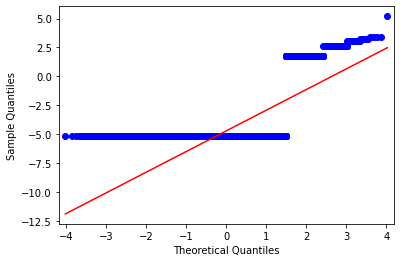

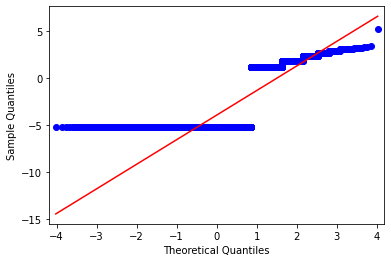

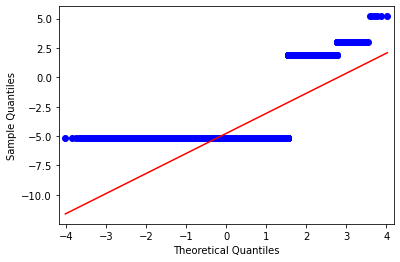

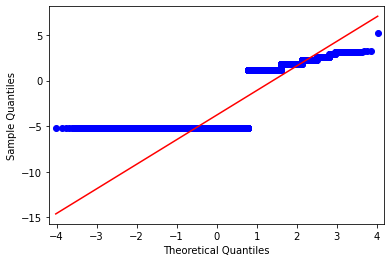

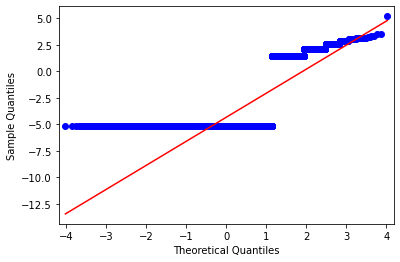

In [13]:
df_qq_plot(transformed_freq)

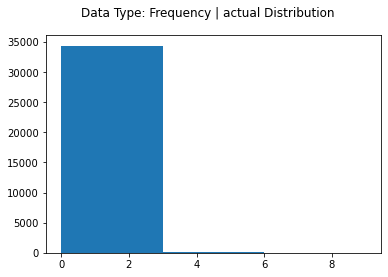

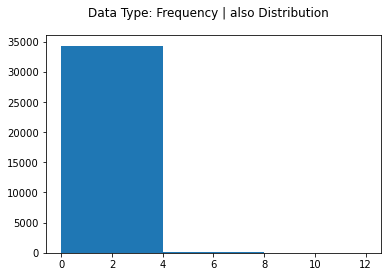

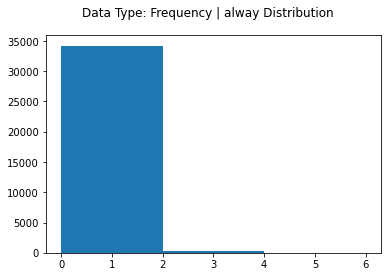

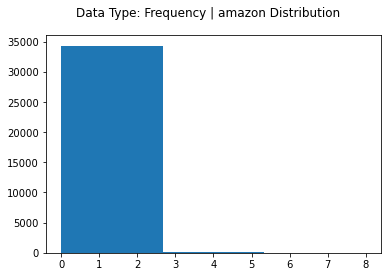

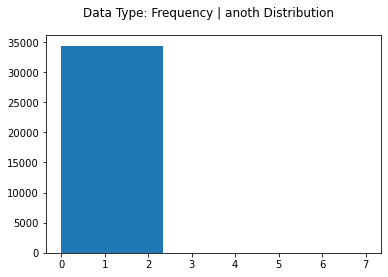

...

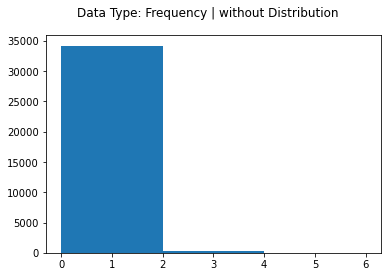

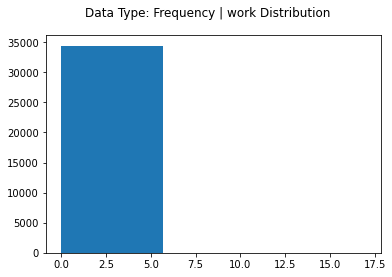

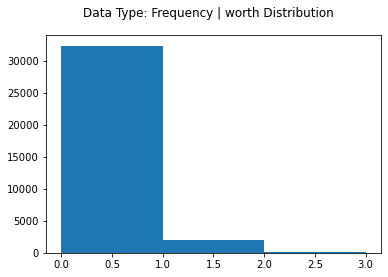

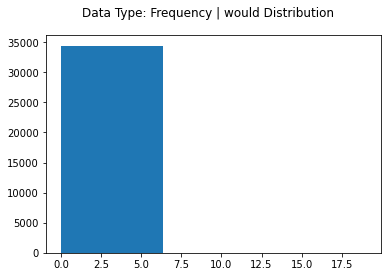

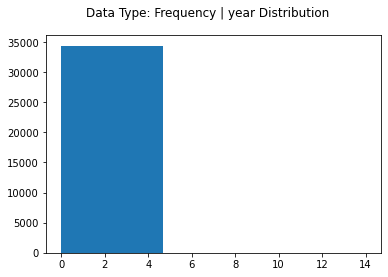

In [14]:
plot_df_distributions(freq, "Frequency")

In [15]:
col_ratio, average_p, average_stat = shapiro_wilk(transformed_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 0.3323


In [16]:
col_ratio, average_p, average_stat = dagastino(transformed_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 19991.0366


In [17]:
col_ratio, average_sig, average_critical = anderson_darling_test(transformed_freq, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average Significant Value: {}".format(round(average_sig, 4)))
print("Average Critical Value: {}".format(round(average_critical, 4)))

0.0% of columns are normally distributed
Average Significant Value: 6.7
Average Critical Value: 0.8058


In [18]:
run_classifiers(simulations, k_folds, [transformed_freq], qt_classes,["Quantile Transformed Frequency"])

*--------------------------------------------*
Simulation: 1 | Data: Quantile Transformed Frequency | Classifier: GaussianNB | Best: 0.72791 | Worst: 0.71735 | Average: 0.72242
Simulation: 1 | Data: Quantile Transformed Frequency | Classifier: MultinomialNB | Best: nan | Worst: nan | Average: nan
Simulation: 1 | Data: Quantile Transformed Frequency | Classifier: BernoulliNB | Best: 0.73038 | Worst: 0.72422 | Average: 0.72705
Simulation: 1 | Data: Quantile Transformed Frequency | Classifier: CategoricalNB | Best: nan | Worst: nan | Average: nan
Simulation: 1 | Data: Quantile Transformed Frequency | Classifier: ComplementNB | Best: nan | Worst: nan | Average: nan
*--------------------------------------------*
Simulation: 2 | Data: Quantile Transformed Frequency | Classifier: GaussianNB | Best: 0.72774 | Worst: 0.72325 | Average: 0.72504
Simulation: 2 | Data: Quantile Transformed Frequency | Classifier: MultinomialNB | Best: nan | Worst: nan | Average: nan
Simulation: 2 | Data: Quantile T

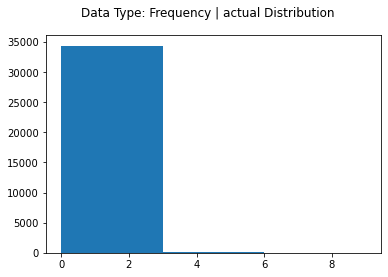

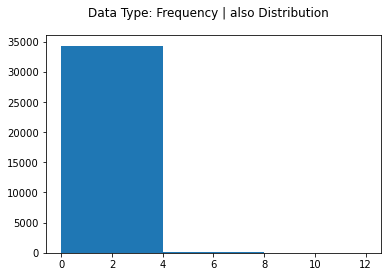

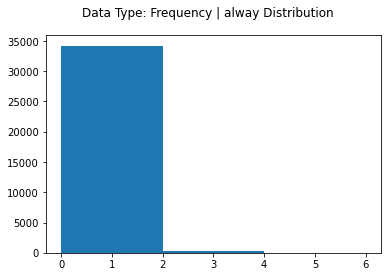

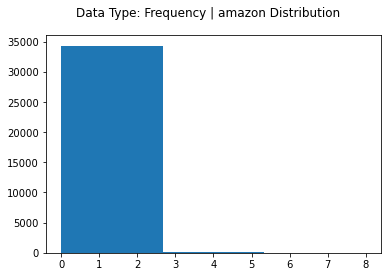

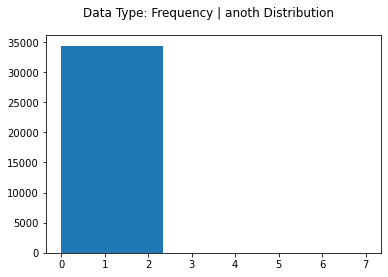

...

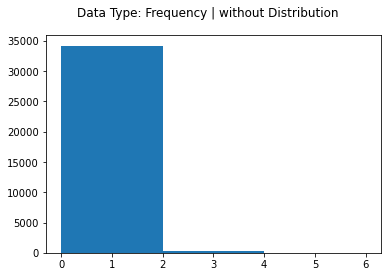

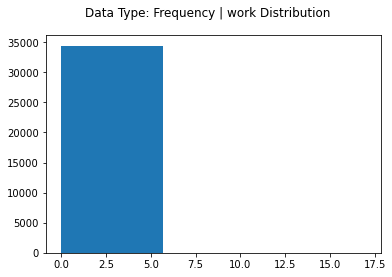

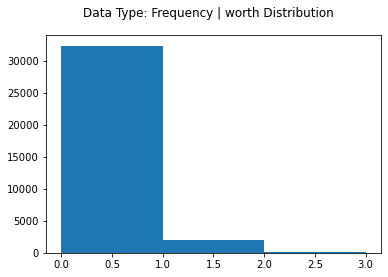

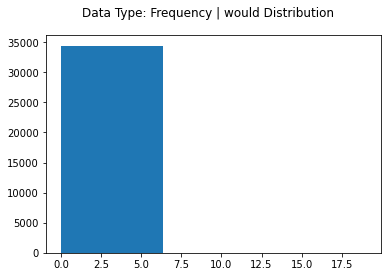

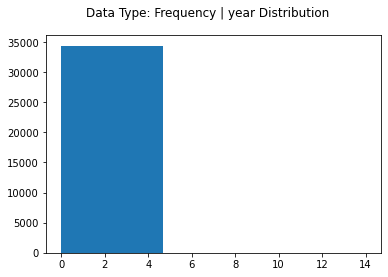

In [19]:
plot_df_distributions(freq, "Frequency")

## Frequency Analysis - MinMax Data

In [20]:
# Load Amazon data
mm_df = pd.read_csv('Amazon Reviews.csv')

# Create parsed dataframes and their types
mm_dfs, mm_names, mm_classes = create_amazon_dataframes(mm_df, True, 'Rating')

mm_boolean = mm_dfs[0]
mm_tfidf = mm_dfs[1]
mm_freq = mm_dfs[2]

In [21]:
# Try to make it normal?
mm = MinMaxScaler(feature_range=(-3, 4))
mm_freq = mm.fit_transform(mm_freq)

mm_freq = pd.DataFrame(data=mm_freq, columns=freq.columns)

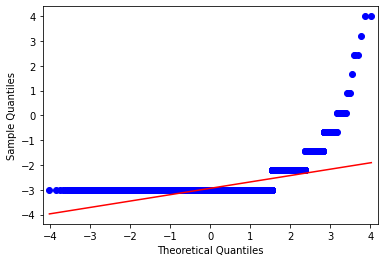

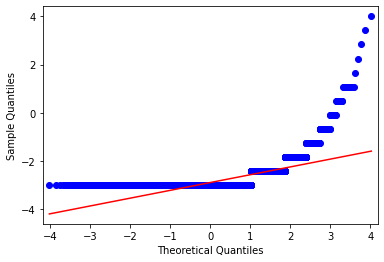

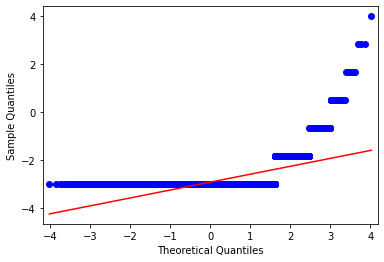

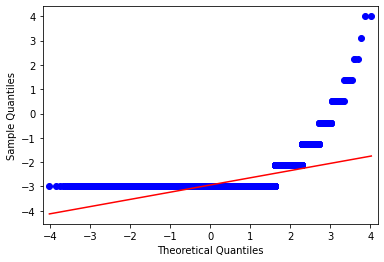

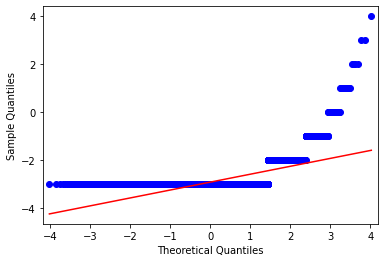

...

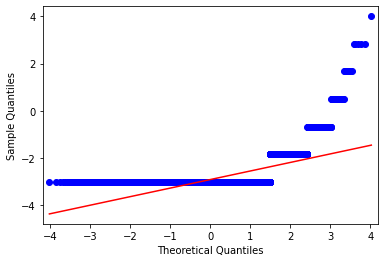

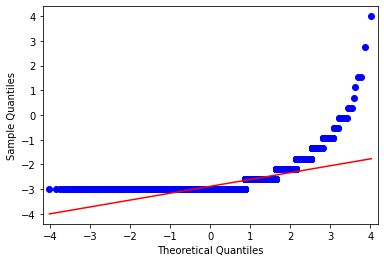

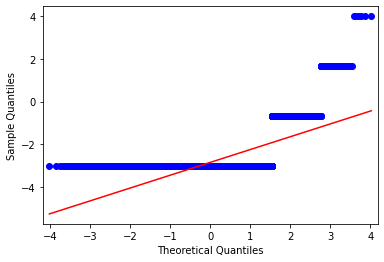

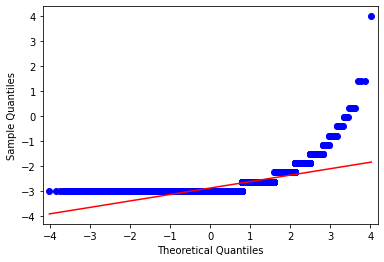

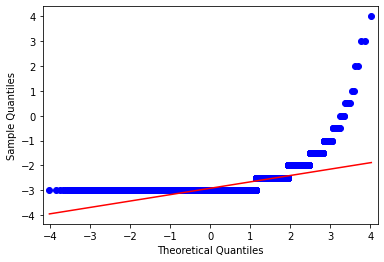

In [22]:
df_qq_plot(mm_freq)

In [23]:
col_ratio, average_p, average_stat = shapiro_wilk(mm_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 0.3036


In [24]:
col_ratio, average_p, average_stat = dagastino(mm_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 37689.9465


In [25]:
col_ratio, average_sig, average_critical = anderson_darling_test(mm_freq, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average Significant Value: {}".format(round(average_sig, 4)))
print("Average Critical Value: {}".format(round(average_critical, 4)))

0.0% of columns are normally distributed
Average Significant Value: 6.7
Average Critical Value: 0.8058


In [26]:
run_classifiers(simulations, k_folds, [mm_freq], classes,["MinMax Transformed Frequency"])

*--------------------------------------------*
Simulation: 1 | Data: MinMax Transformed Frequency | Classifier: GaussianNB | Best: 0.71559 | Worst: 0.70495 | Average: 0.71088
Simulation: 1 | Data: MinMax Transformed Frequency | Classifier: MultinomialNB | Best: nan | Worst: nan | Average: nan
Simulation: 1 | Data: MinMax Transformed Frequency | Classifier: BernoulliNB | Best: 0.5858 | Worst: 0.58325 | Average: 0.58467
Simulation: 1 | Data: MinMax Transformed Frequency | Classifier: CategoricalNB | Best: nan | Worst: nan | Average: nan
Simulation: 1 | Data: MinMax Transformed Frequency | Classifier: ComplementNB | Best: nan | Worst: nan | Average: nan
*--------------------------------------------*
Simulation: 2 | Data: MinMax Transformed Frequency | Classifier: GaussianNB | Best: 0.71762 | Worst: 0.70899 | Average: 0.71315
Simulation: 2 | Data: MinMax Transformed Frequency | Classifier: MultinomialNB | Best: nan | Worst: nan | Average: nan
Simulation: 2 | Data: MinMax Transformed Freque

## Frequency Analysis - Positive *3 Data

In [25]:
# Load Amazon data
pos_df = pd.read_csv('Amazon Reviews.csv')

# Create parsed dataframes and their types
pos_dfs, pos_names, pos_classes = create_amazon_dataframes(pos_df, True, 'Rating')

pos_boolean = pos_dfs[0]
pos_tfidf = pos_dfs[1]
pos_freq = pos_dfs[2]

In [26]:
print(set(list(pos_classes)))

{0.0, 1.0}


In [27]:
# Replace -1 with 1, 1 with 3
pos_classes.replace(1,3, inplace=True)
pos_classes.replace(0,1, inplace=True)

# Change floats to ints
pos_classes = [int(x) for x in list(pos_classes)]

# Make sure it is binary
assert(len(list(set(pos_classes))) == 2)
# Confirm the classes are 3 and 1
print(set(pos_classes))

{1, 3}


In [28]:
pos_freq['classification'] = pos_classes
# Multiply the values by *-1 if the sentiment was negative
pos_freq.update(pos_freq.drop('classification',axis=1).mul(pos_freq.classification,axis=0)[pos_freq.classification.eq(3)])
# Drop the classification column now
pos_freq.drop('classification', inplace=True, axis=1)

In [29]:
pos_freq_avgs = [np.average(pos_freq[col]) for col in pos_freq.columns]    
freq_avgs = [np.average(freq[col]) for col in freq.columns]    

In [30]:
diffs = [x for x, y in zip(pos_freq_avgs, freq_avgs) if x!=y]
print(diffs)

[0.1479556278313393, 0.45853176907887094, 0.1501626205134162, 0.13305842722732025, 0.1677895225926356, 0.16369497037983505, 0.26184806597746546, 0.12420141712161692, 0.30741084911139505, 0.2892902776164479, 0.1358462074573121, 0.1486235335114415, 0.3339528400511093, 0.2967533976071553, 0.35111511209199675, 0.17638517830177722, 0.2415785805552329, 0.24761877105354863, 0.26083168776861426, 0.15878731559995354, 0.19528981298640957, 0.07974213032872575, 0.17382971309095133, 0.4152921361366012, 0.2696886978743176, 0.15753862237193633, 0.14693924962248808, 0.17202927169241491, 0.39900104541758624, 0.16686026251597166, 0.1988906957834824, 0.13851783017772099, 0.20272389359972123, 0.26106400278778025, 0.3525961203391799, 0.16410152166337555, 0.18320943198977813, 0.7434661400859566, 0.20917063538157743, 0.35422232547334187, 0.6460099895458241, 0.23004994772912069, 0.7488384249041701, 0.14011499593448717, 0.1657567661749332, 0.2259263561389244, 0.16427575792775004, 0.29826344523173426, 0.1377918

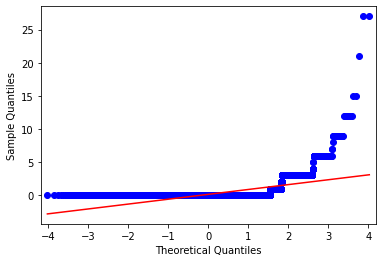

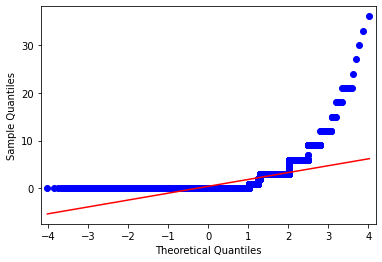

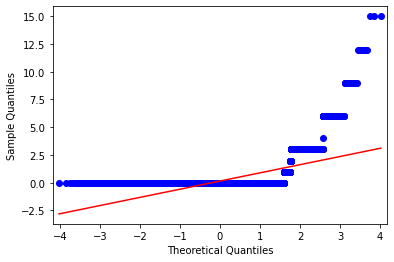

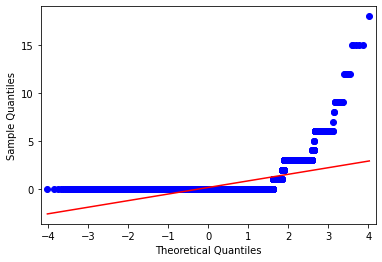

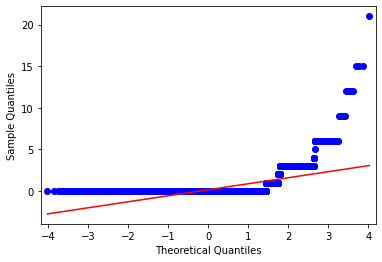

...

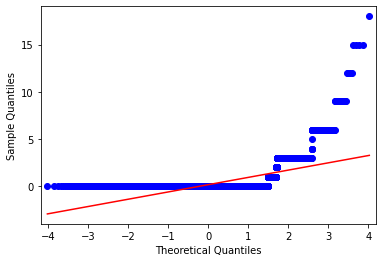

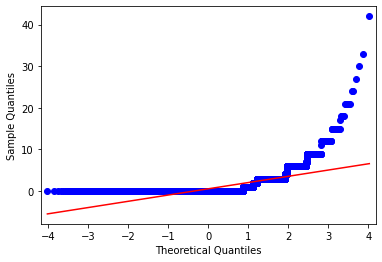

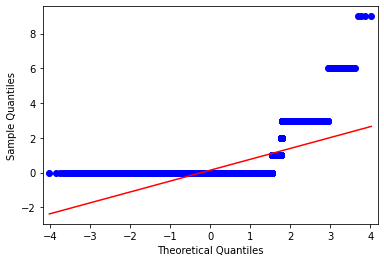

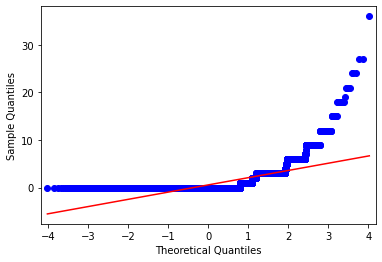

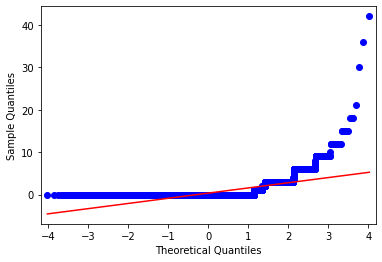

In [31]:
df_qq_plot(pos_freq)

In [32]:
col_ratio, average_p, average_stat = shapiro_wilk(pos_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 0.2728


In [33]:
col_ratio, average_p, average_stat = dagastino(pos_freq, 0.05, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average p value: {}".format(round(average_p, 4)))
print("Average Shapiro stat: {}".format(round(average_stat, 4)))

0.0% of columns are normally distributed
Average p value: 0.0
Average Shapiro stat: 0.2728


In [34]:
col_ratio, average_sig, average_critical = anderson_darling_test(pos_freq, True)

print("{}% of columns are normally distributed".format(col_ratio))
print("Average Significant Value: {}".format(round(average_sig, 4)))
print("Average Critical Value: {}".format(round(average_critical, 4)))

0.0% of columns are normally distributed
Average Significant Value: 6.7
Average Critical Value: 0.8058


In [35]:
run_classifiers(simulations, k_folds, [pos_freq], classes,["*3 Transformed Frequency"])

*--------------------------------------------*
Simulation: 1 | Data: *3 Transformed Frequency | Classifier: GaussianNB | Best: 0.85225 | Worst: 0.84266 | Average: 0.84599
Simulation: 1 | Data: *3 Transformed Frequency | Classifier: MultinomialNB | Best: 0.72052 | Worst: 0.70468 | Average: 0.71262
Simulation: 1 | Data: *3 Transformed Frequency | Classifier: BernoulliNB | Best: 0.73451 | Worst: 0.72703 | Average: 0.73024
Error Calculating: CategoricalNB
Simulation: 1 | Data: *3 Transformed Frequency | Classifier: ComplementNB | Best: 0.7383 | Worst: 0.73328 | Average: 0.73493
*--------------------------------------------*
Simulation: 2 | Data: *3 Transformed Frequency | Classifier: GaussianNB | Best: 0.8519 | Worst: 0.8446 | Average: 0.8472
Simulation: 2 | Data: *3 Transformed Frequency | Classifier: MultinomialNB | Best: 0.71876 | Worst: 0.70706 | Average: 0.71429
Simulation: 2 | Data: *3 Transformed Frequency | Classifier: BernoulliNB | Best: 0.73909 | Worst: 0.72677 | Average: 0.7324


Now Testing: actual
*------------------------------------------------------------------*
Scaled PDF: 0.5323318702552027 | Normal PDF: 1.1761556170111138


<IPython.core.display.Javascript object>


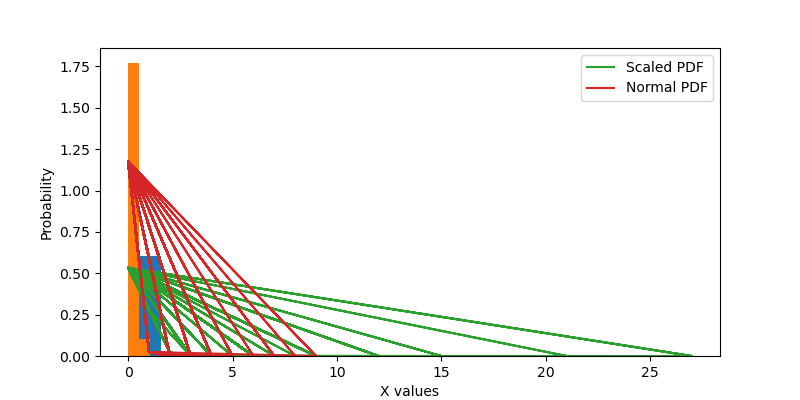

Now Testing: also
*------------------------------------------------------------------*
Scaled PDF: 0.26397111086125413 | Normal PDF: 0.6747945689590116


<IPython.core.display.Javascript object>


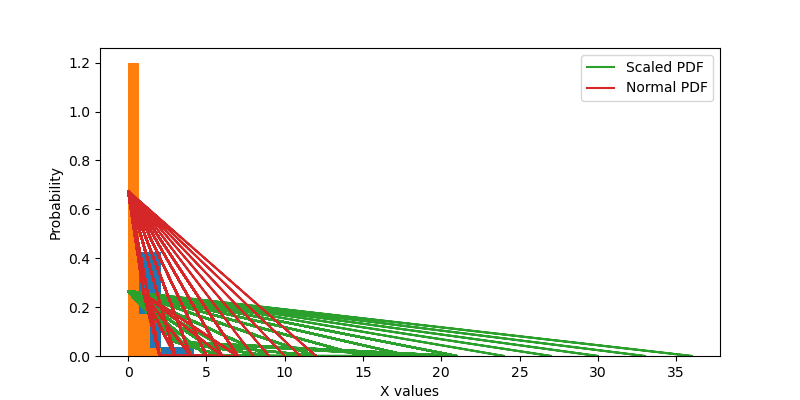

Now Testing: alway
*------------------------------------------------------------------*
Scaled PDF: 0.5300507530128981 | Normal PDF: 1.3741928310686415


<IPython.core.display.Javascript object>


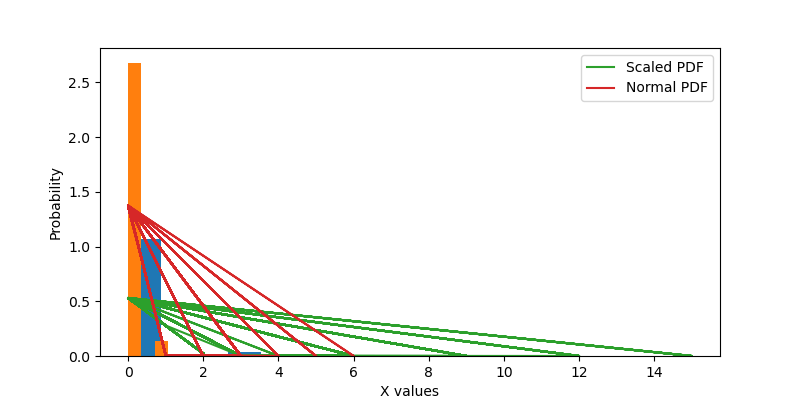

Now Testing: amazon
*------------------------------------------------------------------*
Scaled PDF: 0.569480298905187 | Normal PDF: 1.1539810926485978


<IPython.core.display.Javascript object>


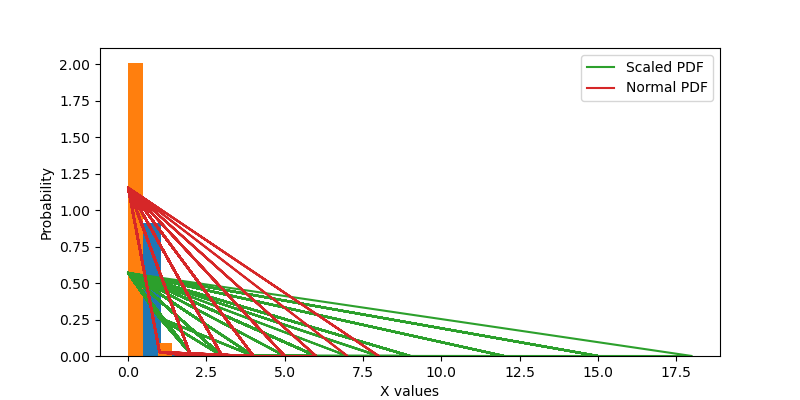

Now Testing: anoth
*------------------------------------------------------------------*
Scaled PDF: 0.5374681985961061 | Normal PDF: 1.1689545338872576


<IPython.core.display.Javascript object>


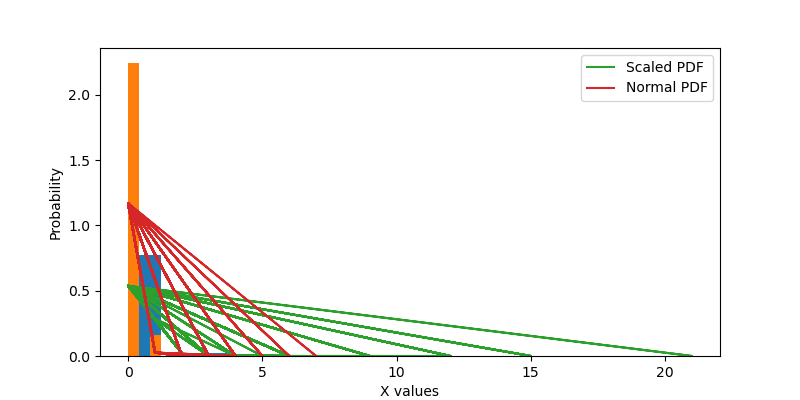

Now Testing: around
*------------------------------------------------------------------*
Scaled PDF: 0.5031863566298094 | Normal PDF: 1.2538599449602883


<IPython.core.display.Javascript object>


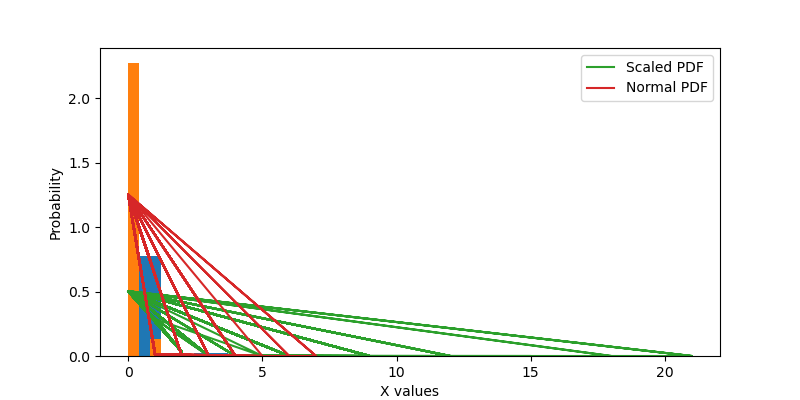

Now Testing: back
*------------------------------------------------------------------*
Scaled PDF: 0.39121087456524706 | Normal PDF: 0.8428115097754882


<IPython.core.display.Javascript object>


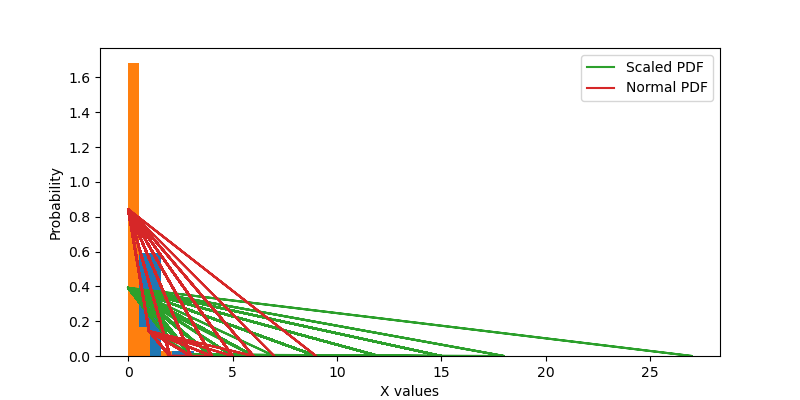

Now Testing: bad
*------------------------------------------------------------------*
Scaled PDF: 0.6382953586868201 | Normal PDF: 1.1815334763712584


<IPython.core.display.Javascript object>


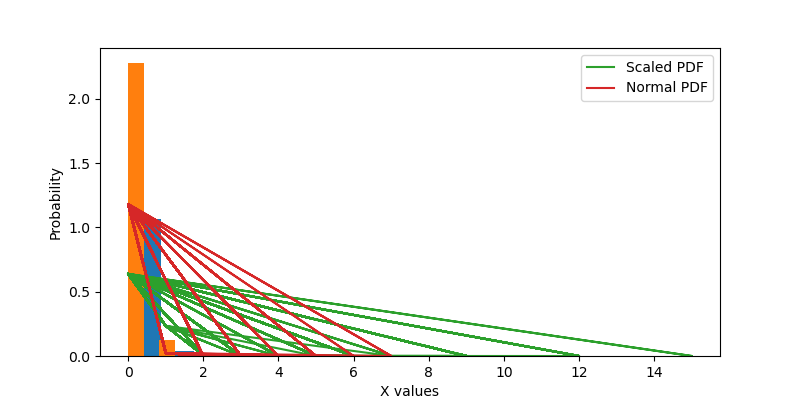

Now Testing: best
*------------------------------------------------------------------*
Scaled PDF: 0.3390858052364108 | Normal PDF: 0.9198771198016362


<IPython.core.display.Javascript object>


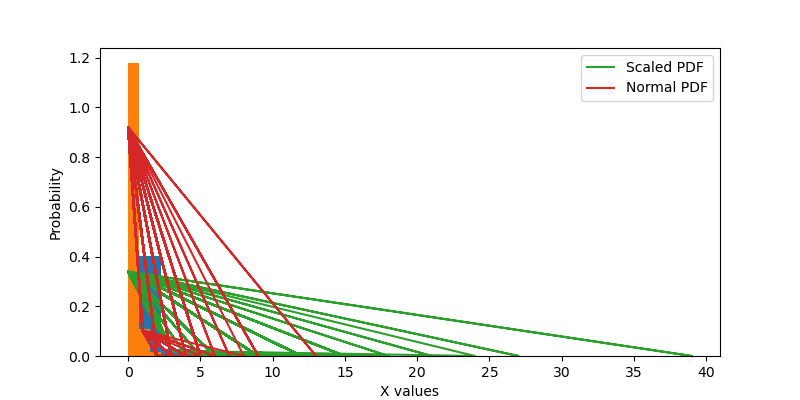

Now Testing: better
*------------------------------------------------------------------*
Scaled PDF: 0.3814172322592893 | Normal PDF: 0.867941389221037


<IPython.core.display.Javascript object>


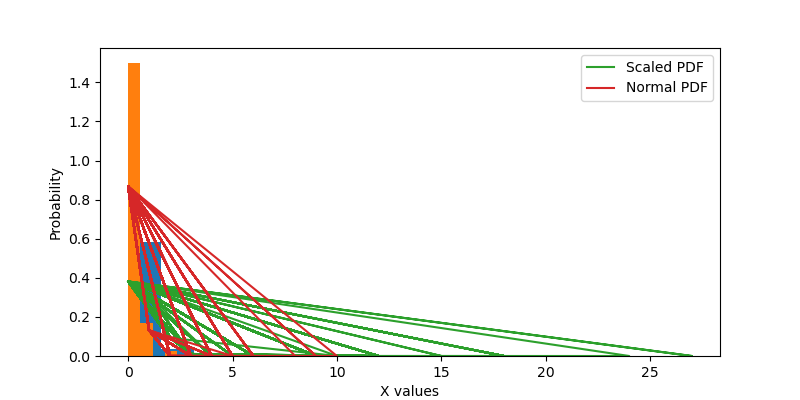

Now Testing: big
*------------------------------------------------------------------*
Scaled PDF: 0.5653993204539028 | Normal PDF: 1.3720886533005983


<IPython.core.display.Javascript object>


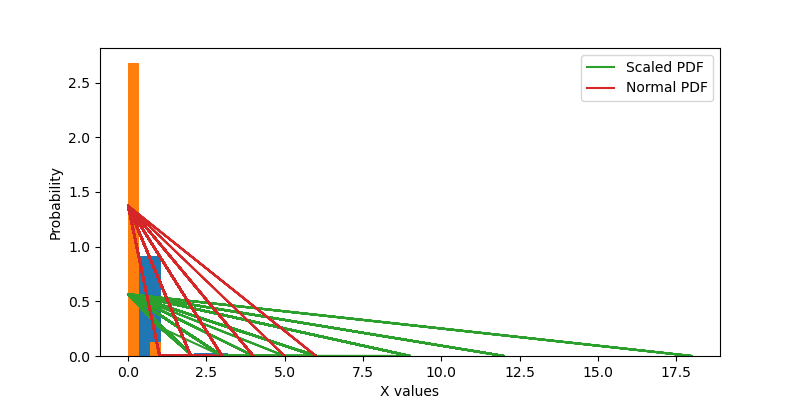

Now Testing: bit
*------------------------------------------------------------------*
Scaled PDF: 0.5174258996453538 | Normal PDF: 1.3637227802003367


<IPython.core.display.Javascript object>


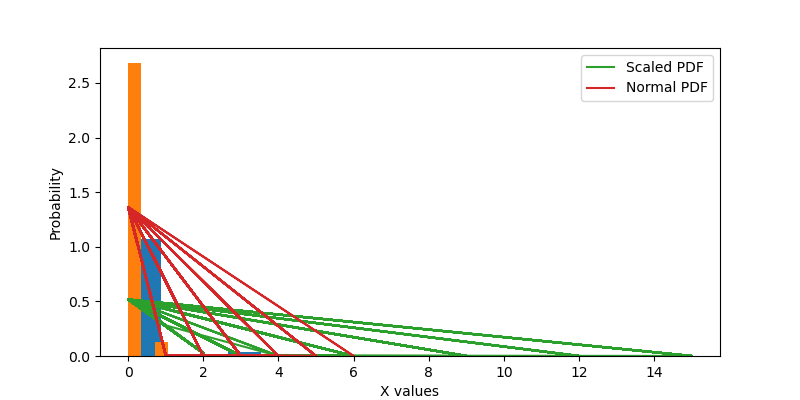

Now Testing: book
*------------------------------------------------------------------*
Scaled PDF: 0.21914537410083895 | Normal PDF: 0.46253615484383065


<IPython.core.display.Javascript object>


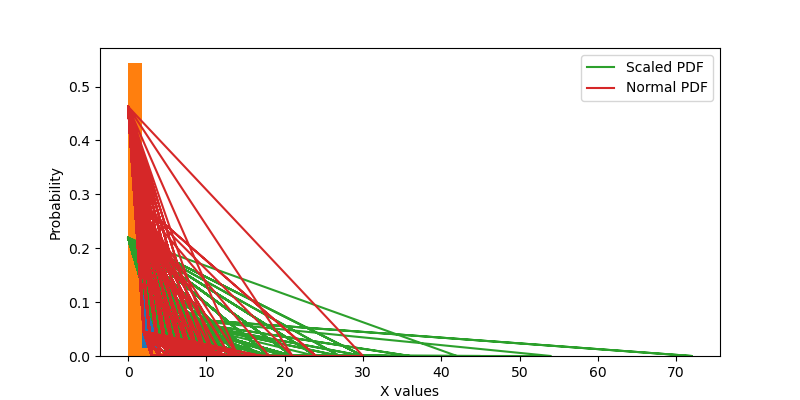

Now Testing: bought
*------------------------------------------------------------------*
Scaled PDF: 0.40732968292164584 | Normal PDF: 0.9110354331973856


<IPython.core.display.Javascript object>


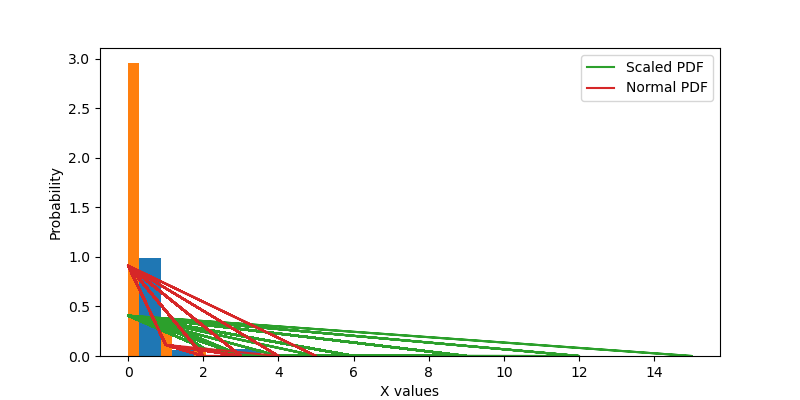

Now Testing: buy
*------------------------------------------------------------------*
Scaled PDF: 0.3556670175960284 | Normal PDF: 0.7829533900655903


<IPython.core.display.Javascript object>


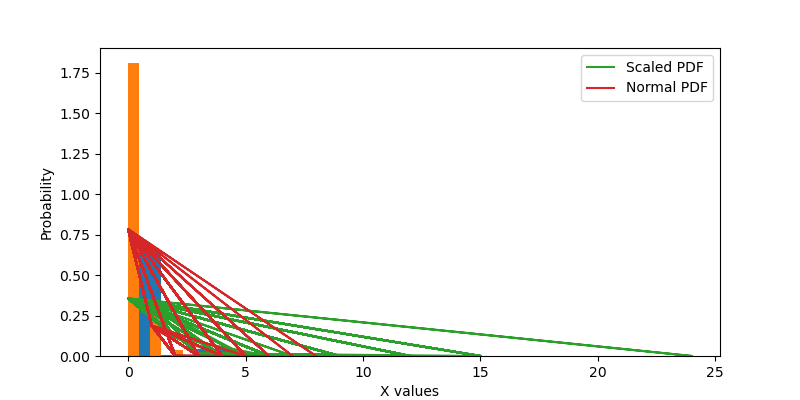

Now Testing: cant
*------------------------------------------------------------------*
Scaled PDF: 0.529016777366747 | Normal PDF: 1.162281049572365


<IPython.core.display.Javascript object>


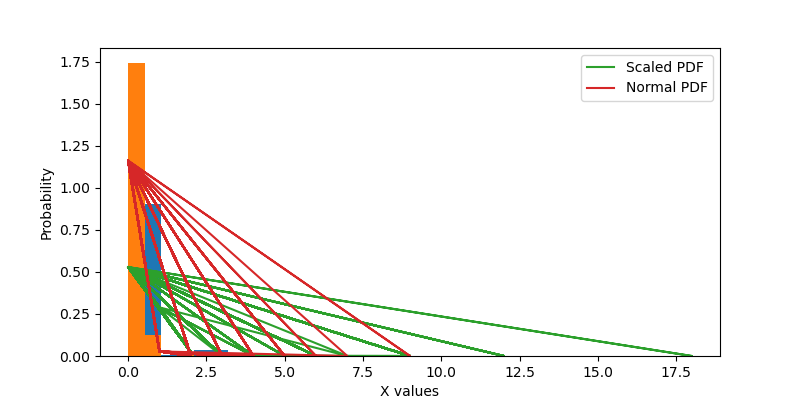

Now Testing: come
*------------------------------------------------------------------*
Scaled PDF: 0.42616821889214485 | Normal PDF: 1.0094996792509434


<IPython.core.display.Javascript object>


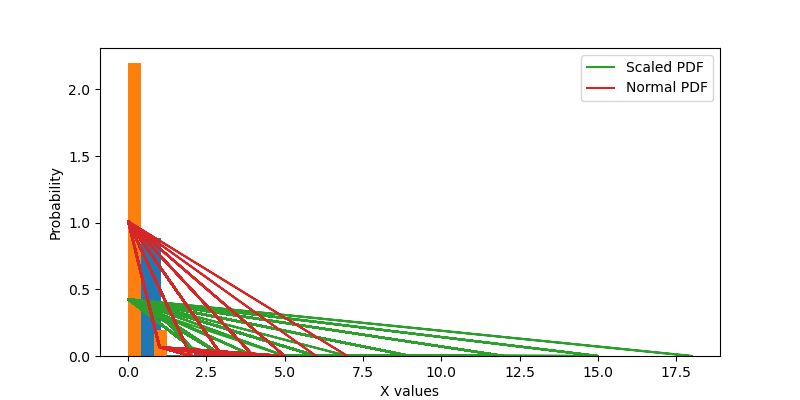

Now Testing: could
*------------------------------------------------------------------*
Scaled PDF: 0.425101622531956 | Normal PDF: 0.9051627033826425


<IPython.core.display.Javascript object>


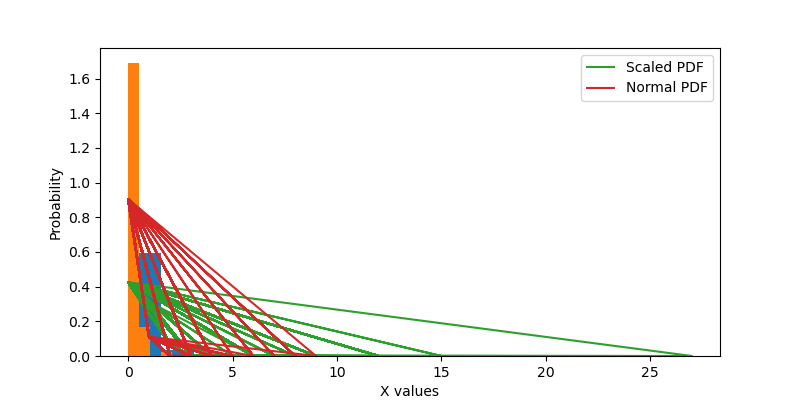

Now Testing: day
*------------------------------------------------------------------*
Scaled PDF: 0.38031879136007724 | Normal PDF: 0.897703067540212


<IPython.core.display.Javascript object>


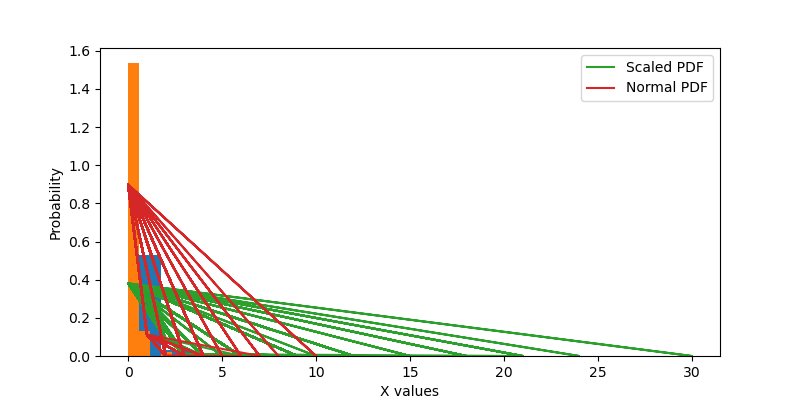

Now Testing: didnt
*------------------------------------------------------------------*
Scaled PDF: 0.5554087831947373 | Normal PDF: 1.1669779583175182


<IPython.core.display.Javascript object>


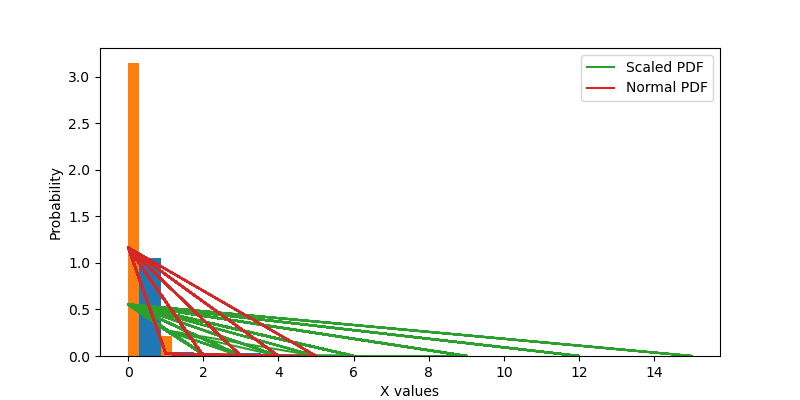

Now Testing: differ
*------------------------------------------------------------------*
Scaled PDF: 0.4502648519217799 | Normal PDF: 1.1060736831433144


<IPython.core.display.Javascript object>


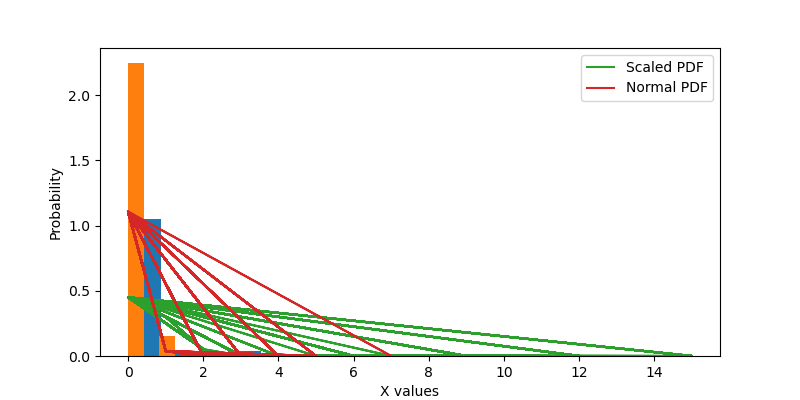

Now Testing: disappoint
*------------------------------------------------------------------*
Scaled PDF: 0.9619946096150678 | Normal PDF: 1.598581076859208


<IPython.core.display.Javascript object>


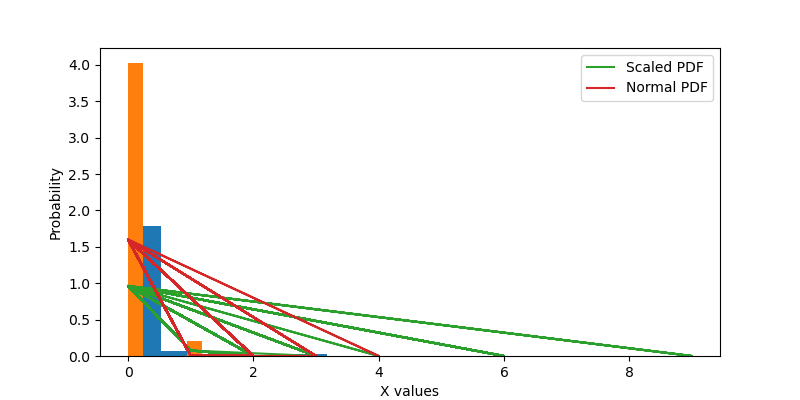

Now Testing: doesnt
*------------------------------------------------------------------*
Scaled PDF: 0.5238592453944614 | Normal PDF: 1.1391384599319616


<IPython.core.display.Javascript object>


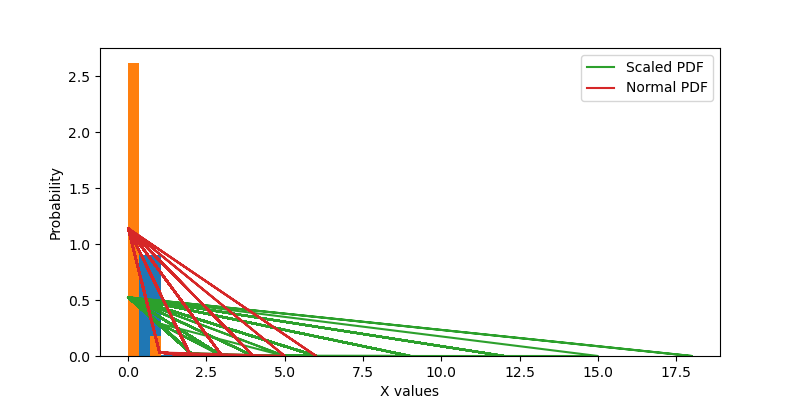

Now Testing: dont
*------------------------------------------------------------------*
Scaled PDF: 0.2998540133552933 | Normal PDF: 0.6773638305944394


<IPython.core.display.Javascript object>


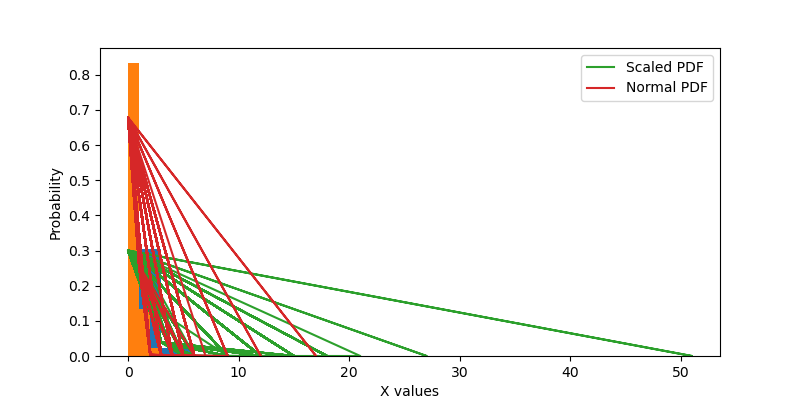

Now Testing: easi
*------------------------------------------------------------------*
Scaled PDF: 0.37938672134466356 | Normal PDF: 1.0518990873841012


<IPython.core.display.Javascript object>


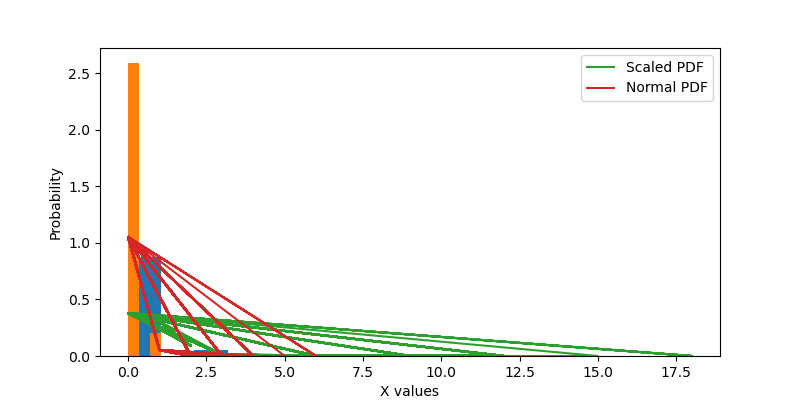

Now Testing: end
*------------------------------------------------------------------*
Scaled PDF: 0.4589852680785941 | Normal PDF: 1.07871523495388


<IPython.core.display.Javascript object>


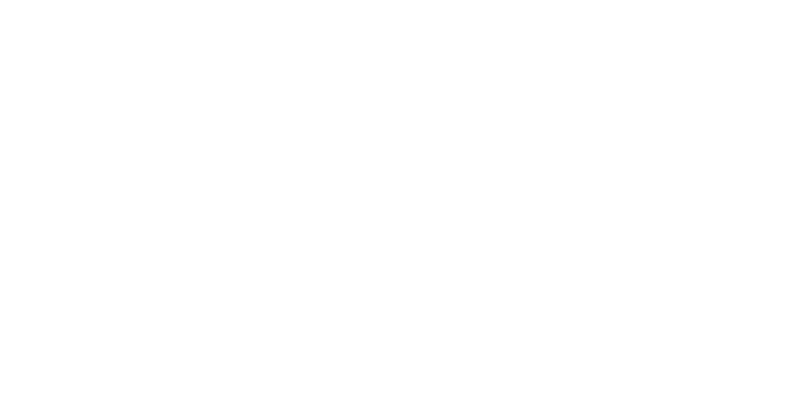

Now Testing: enjoy
*------------------------------------------------------------------*
Scaled PDF: 0.5317475093230137 | Normal PDF: 1.410504215156375


<IPython.core.display.Javascript object>


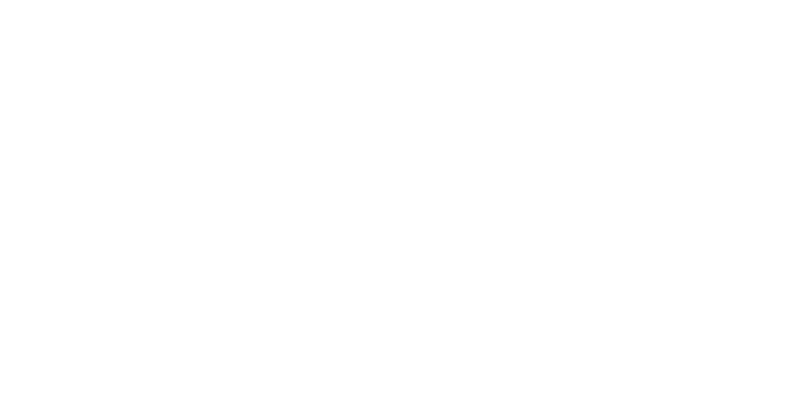

Now Testing: enough
*------------------------------------------------------------------*
Scaled PDF: 0.4934710083051543 | Normal PDF: 1.2229915761907


<IPython.core.display.Javascript object>


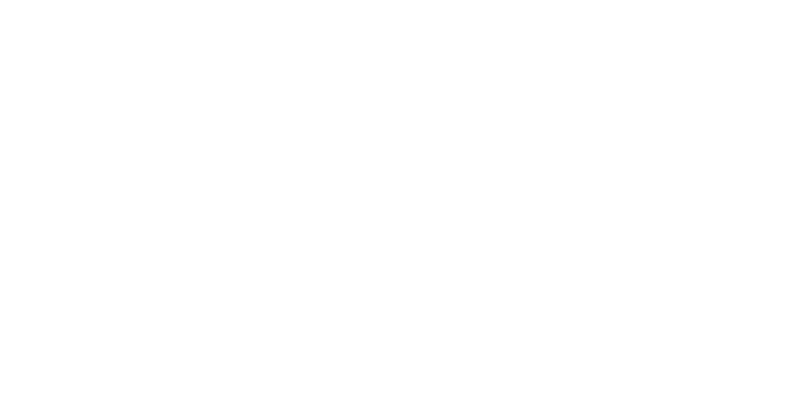

Now Testing: even
*------------------------------------------------------------------*
Scaled PDF: 0.3159707102345634 | Normal PDF: 0.6899043388996952


<IPython.core.display.Javascript object>


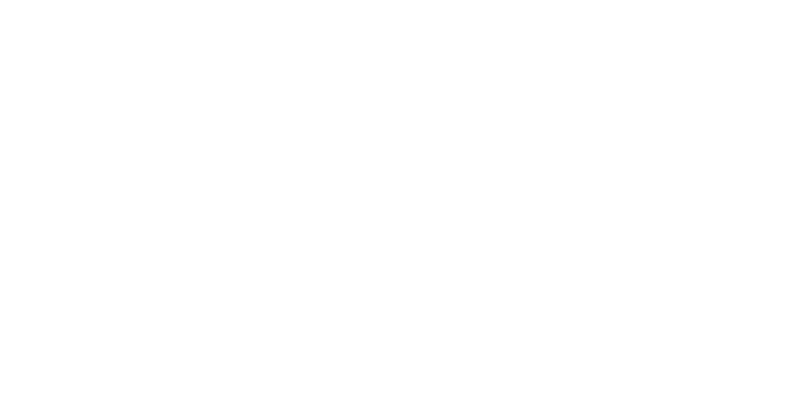

Now Testing: ever
*------------------------------------------------------------------*
Scaled PDF: 0.5124361236917011 | Normal PDF: 1.251010680992777


<IPython.core.display.Javascript object>


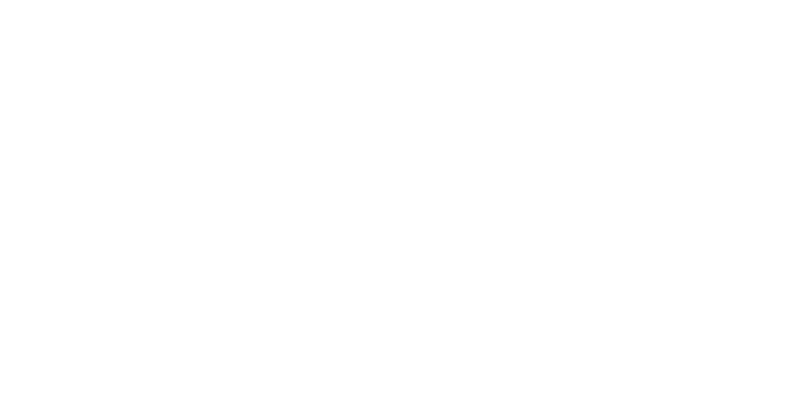

Now Testing: everi
*------------------------------------------------------------------*
Scaled PDF: 0.4566801556388726 | Normal PDF: 1.1077624629838019


<IPython.core.display.Javascript object>


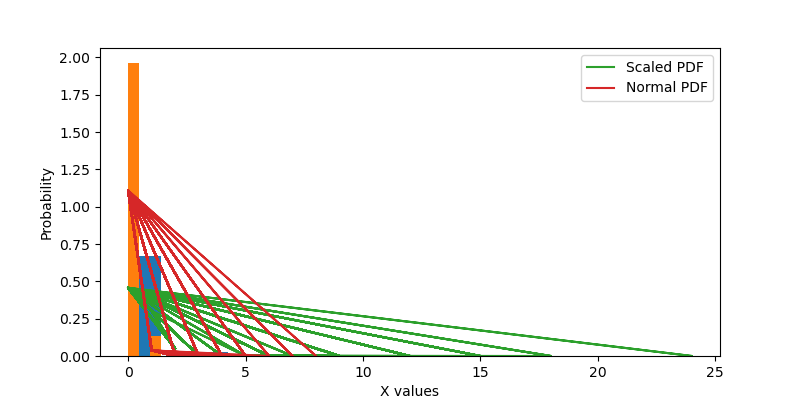

Now Testing: far
*------------------------------------------------------------------*
Scaled PDF: 0.5607608443544461 | Normal PDF: 1.3864362914916335


<IPython.core.display.Javascript object>


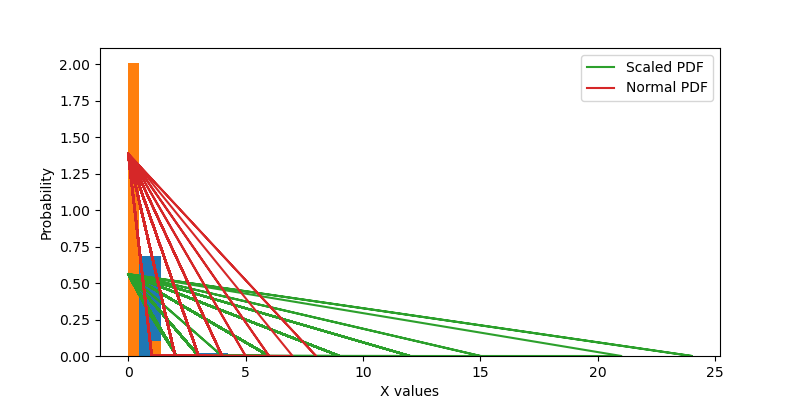

Now Testing: feel
*------------------------------------------------------------------*
Scaled PDF: 0.43662651425764076 | Normal PDF: 1.064158412737857


<IPython.core.display.Javascript object>


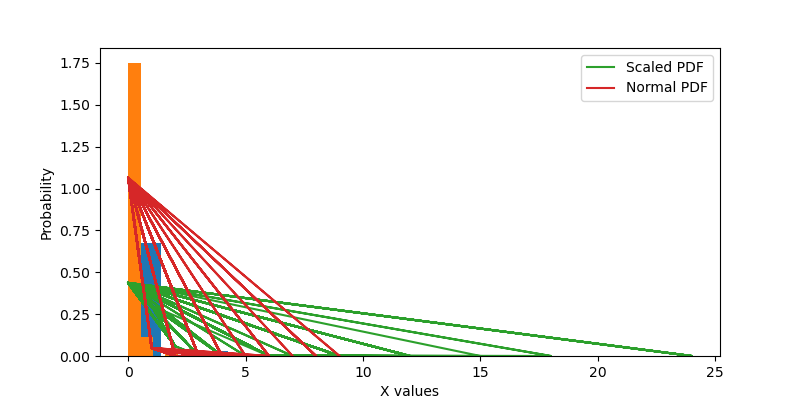

Now Testing: find
*------------------------------------------------------------------*
Scaled PDF: 0.3834600719744003 | Normal PDF: 0.935039675867989


<IPython.core.display.Javascript object>


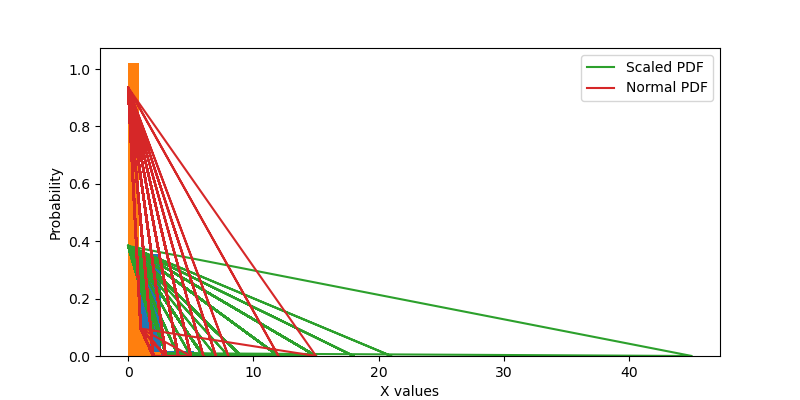

Now Testing: first
*------------------------------------------------------------------*
Scaled PDF: 0.3149572978684821 | Normal PDF: 0.7526761808654188


<IPython.core.display.Javascript object>


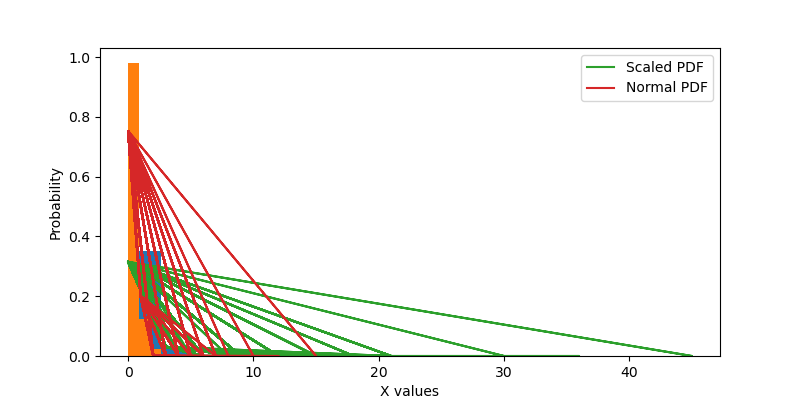

Now Testing: fit
*------------------------------------------------------------------*
Scaled PDF: 0.4723393190057877 | Normal PDF: 1.1682885364597004


<IPython.core.display.Javascript object>


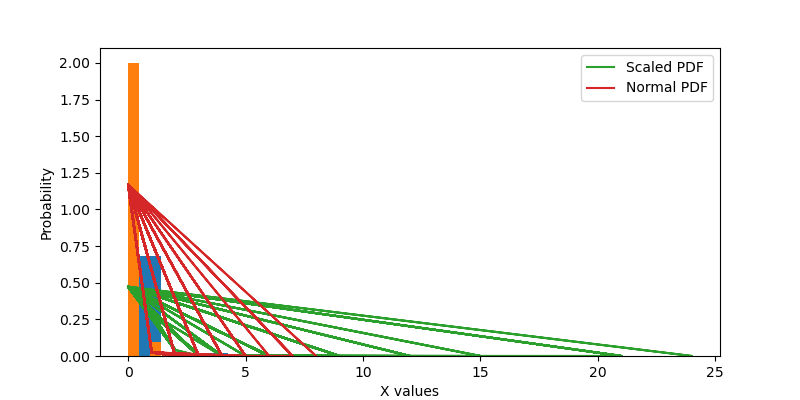

Now Testing: found
*------------------------------------------------------------------*
Scaled PDF: 0.5015419783822309 | Normal PDF: 1.2017103115598713


<IPython.core.display.Javascript object>


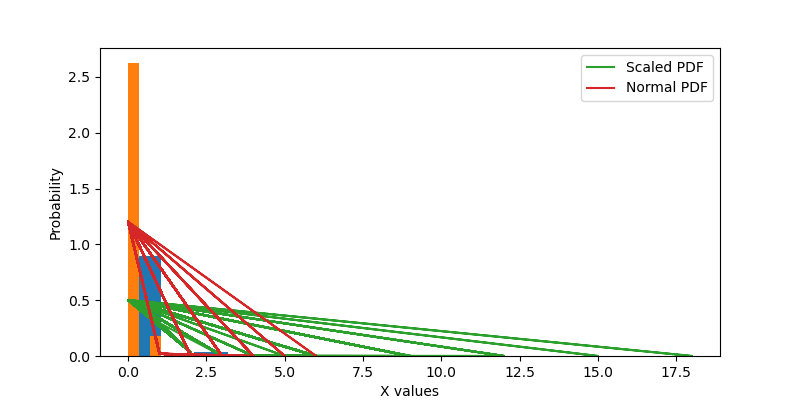

Now Testing: get
*------------------------------------------------------------------*
Scaled PDF: 0.2135024813868649 | Normal PDF: 0.46163278603114816


<IPython.core.display.Javascript object>


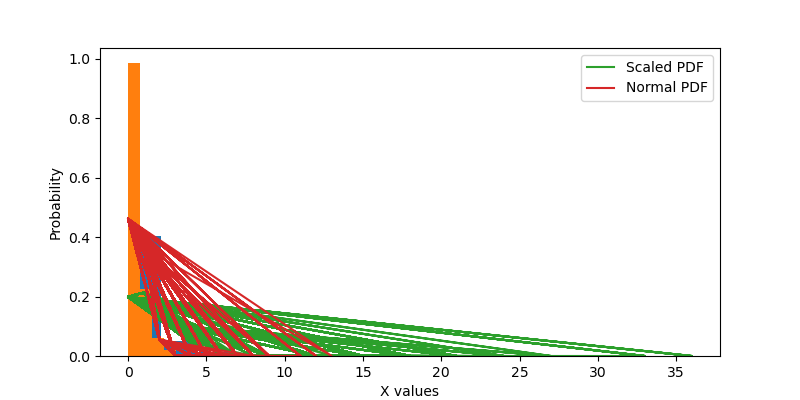

Now Testing: give
*------------------------------------------------------------------*
Scaled PDF: 0.47289685059202674 | Normal PDF: 1.10522192662288


<IPython.core.display.Javascript object>


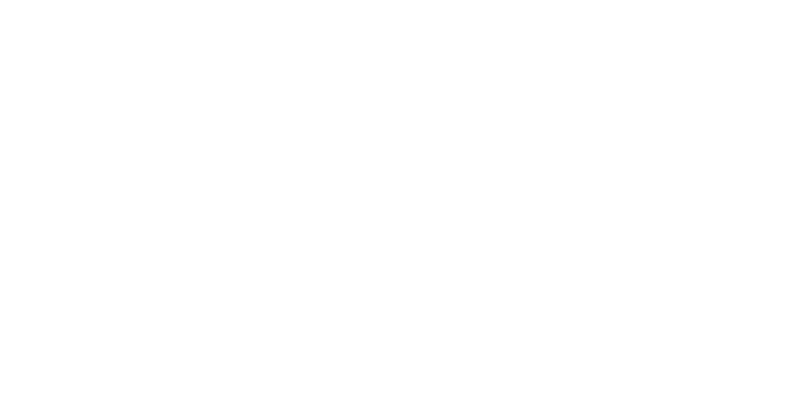

Now Testing: go
*------------------------------------------------------------------*
Scaled PDF: 0.3203156149754979 | Normal PDF: 0.7494090268290755


<IPython.core.display.Javascript object>


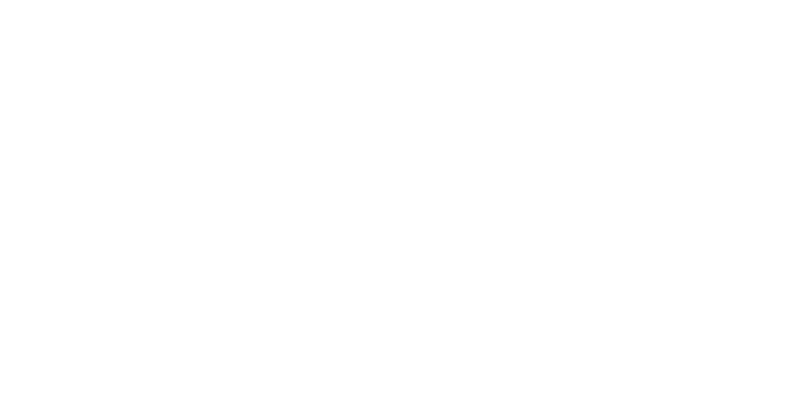

Now Testing: good
*------------------------------------------------------------------*
Scaled PDF: 0.2337617061613787 | Normal PDF: 0.5495902976105272


<IPython.core.display.Javascript object>


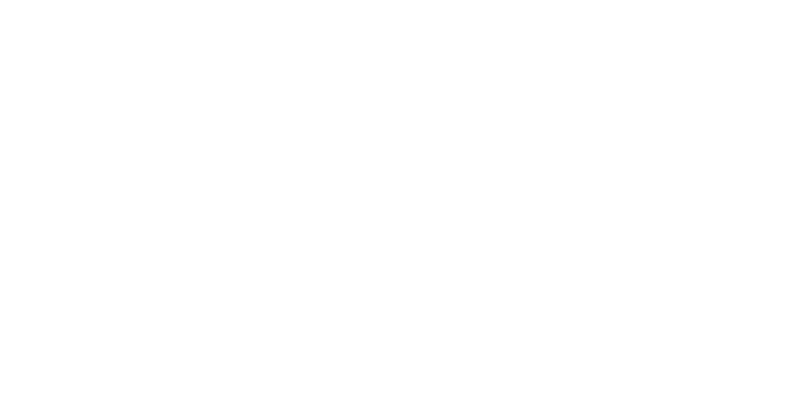

Now Testing: got
*------------------------------------------------------------------*
Scaled PDF: 0.4525028014910344 | Normal PDF: 1.0044902965303972


<IPython.core.display.Javascript object>


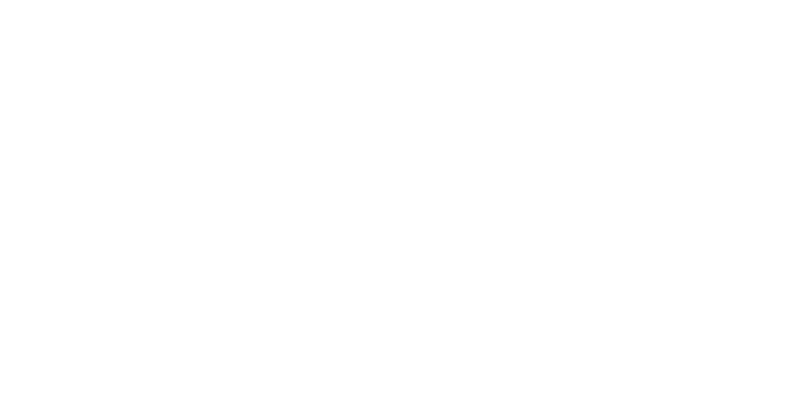

Now Testing: great
*------------------------------------------------------------------*
Scaled PDF: 0.23049622994750343 | Normal PDF: 0.5717997066604218


<IPython.core.display.Javascript object>


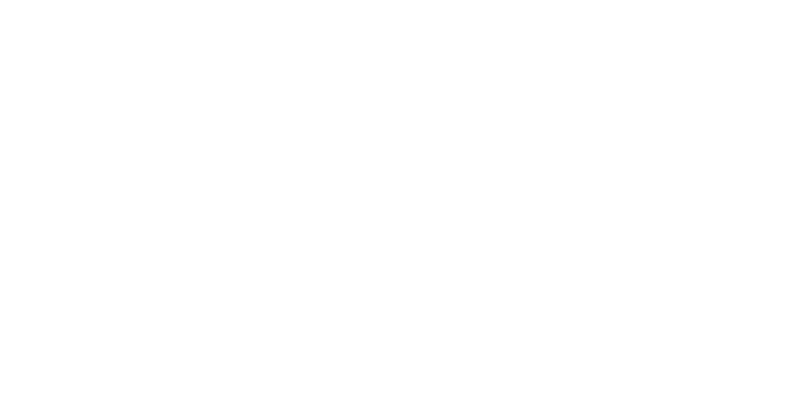

Now Testing: hard
*------------------------------------------------------------------*
Scaled PDF: 0.5860730627422311 | Normal PDF: 1.2707724355876442


<IPython.core.display.Javascript object>


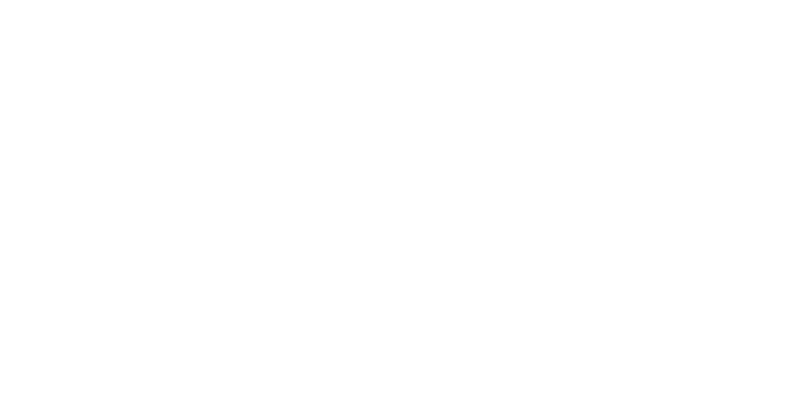

Now Testing: help
*------------------------------------------------------------------*
Scaled PDF: 0.4944320350787992 | Normal PDF: 1.2211892362010786


<IPython.core.display.Javascript object>


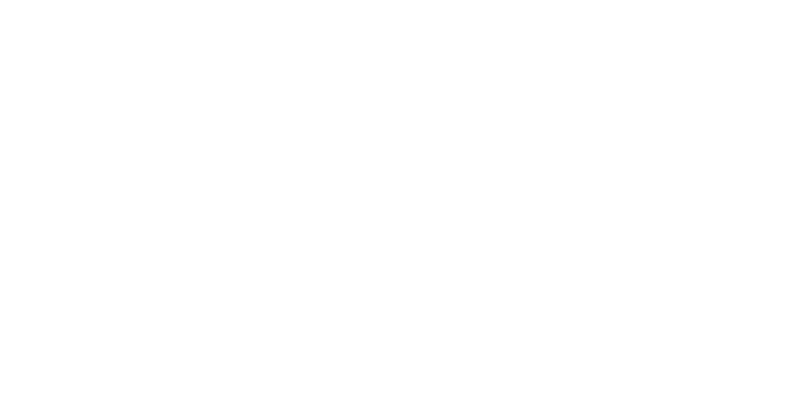

Now Testing: high
*------------------------------------------------------------------*
Scaled PDF: 0.43653337257440294 | Normal PDF: 1.13792080731618


<IPython.core.display.Javascript object>


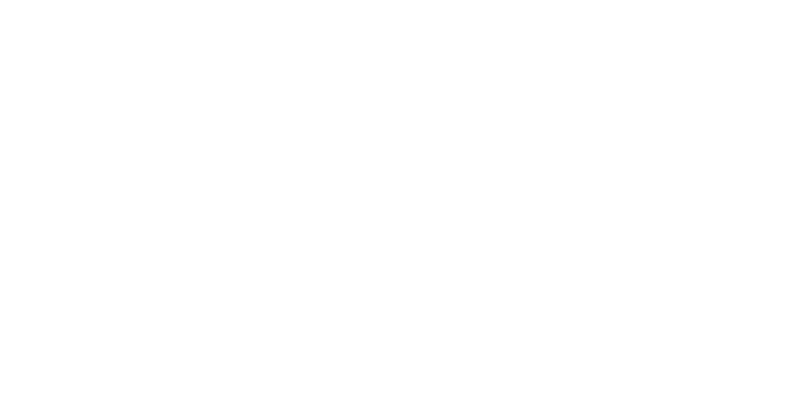

Now Testing: howev
*------------------------------------------------------------------*
Scaled PDF: 0.5146634666660213 | Normal PDF: 1.1818133267126587


<IPython.core.display.Javascript object>


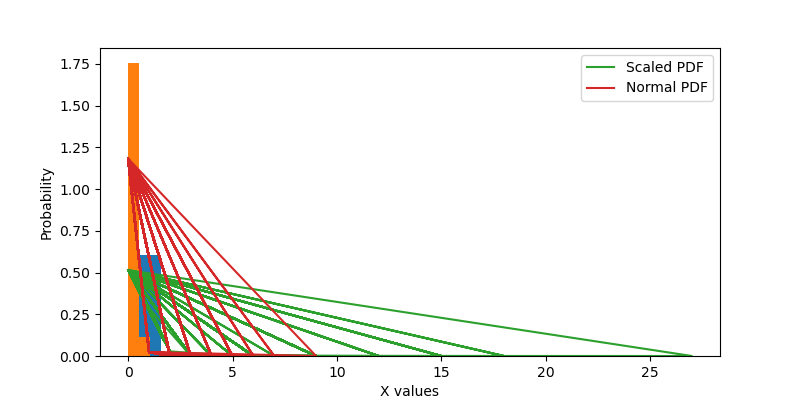

Now Testing: im
*------------------------------------------------------------------*
Scaled PDF: 0.35872901589768585 | Normal PDF: 0.8392627290055714


<IPython.core.display.Javascript object>


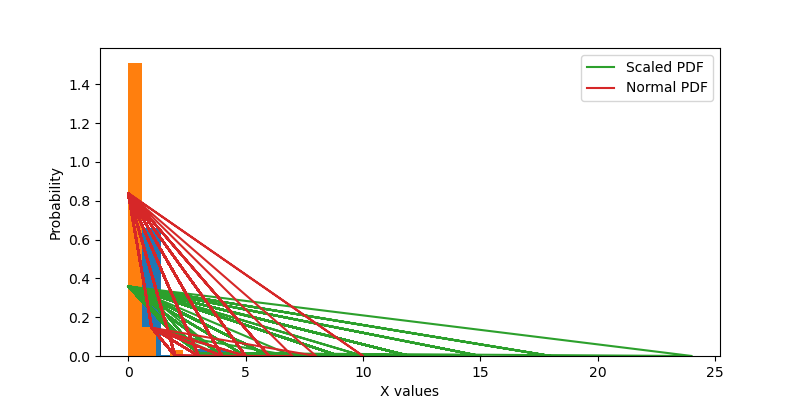

Now Testing: item
*------------------------------------------------------------------*
Scaled PDF: 0.5557067703959347 | Normal PDF: 1.1517790470728677


<IPython.core.display.Javascript object>


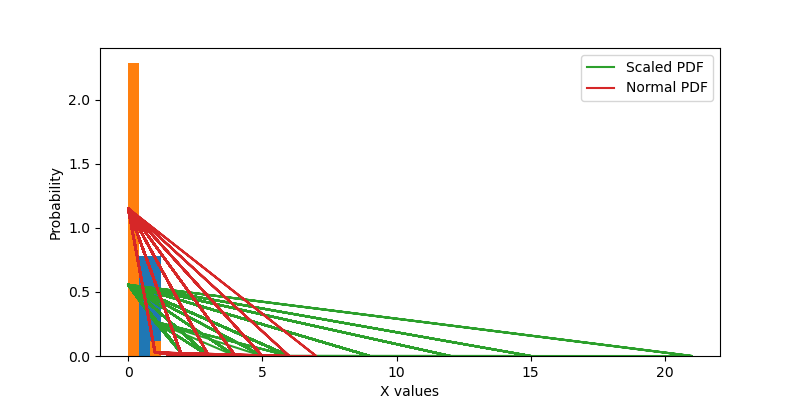

Now Testing: ive
*------------------------------------------------------------------*
Scaled PDF: 0.3494798665879962 | Normal PDF: 0.8831597691617865


<IPython.core.display.Javascript object>


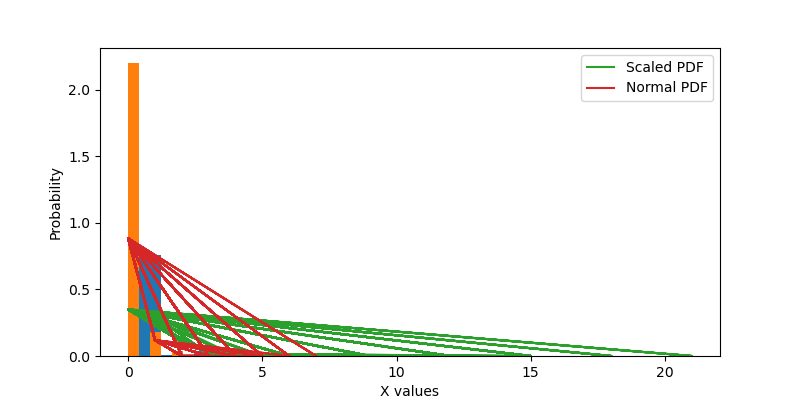

Now Testing: keep
*------------------------------------------------------------------*
Scaled PDF: 0.4718701980609609 | Normal PDF: 1.198765245385997


<IPython.core.display.Javascript object>


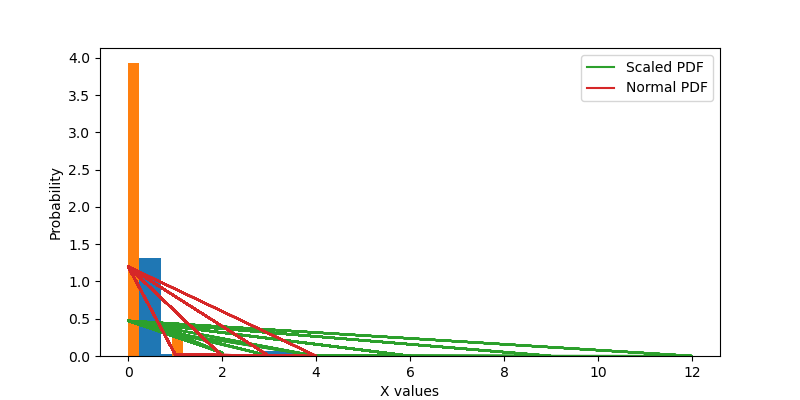

Now Testing: know
*------------------------------------------------------------------*
Scaled PDF: 0.42645009375710335 | Normal PDF: 0.9450201407851825


<IPython.core.display.Javascript object>


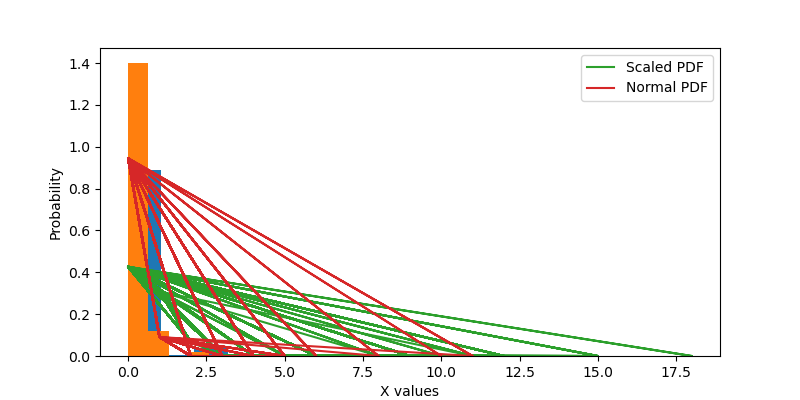

Now Testing: last
*------------------------------------------------------------------*
Scaled PDF: 0.5088712191107766 | Normal PDF: 1.2122103474423687


<IPython.core.display.Javascript object>


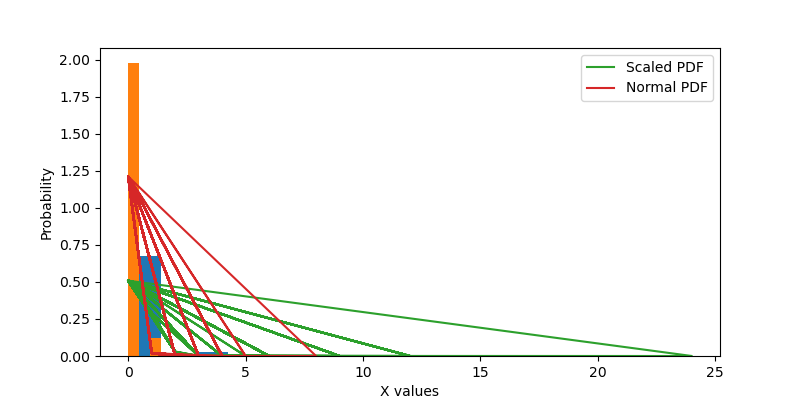

Now Testing: like
*------------------------------------------------------------------*
Scaled PDF: 0.18860097844134938 | Normal PDF: 0.4029545431862342


<IPython.core.display.Javascript object>


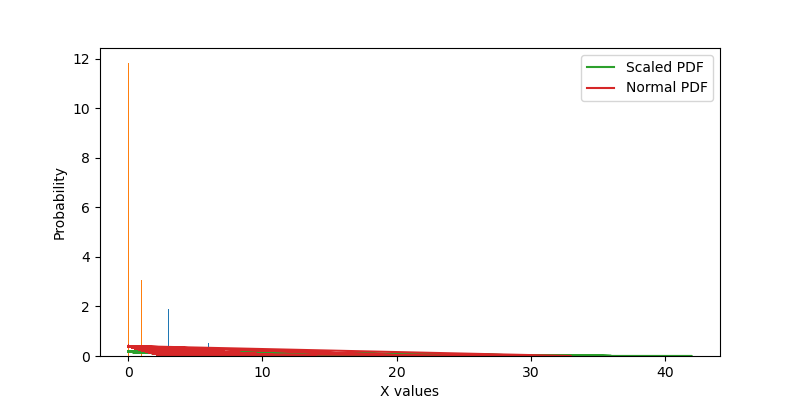

Now Testing: littl
*------------------------------------------------------------------*
Scaled PDF: 0.33995894213226463 | Normal PDF: 0.8717885495323419


<IPython.core.display.Javascript object>


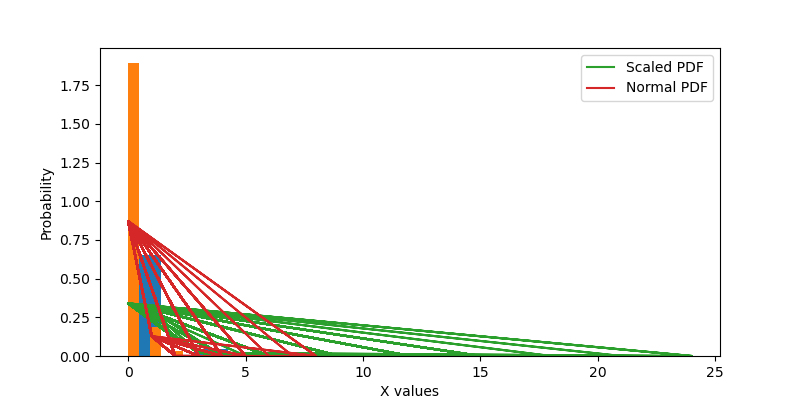

Now Testing: long
*------------------------------------------------------------------*
Scaled PDF: 0.5072961494386711 | Normal PDF: 1.238913255050062


<IPython.core.display.Javascript object>


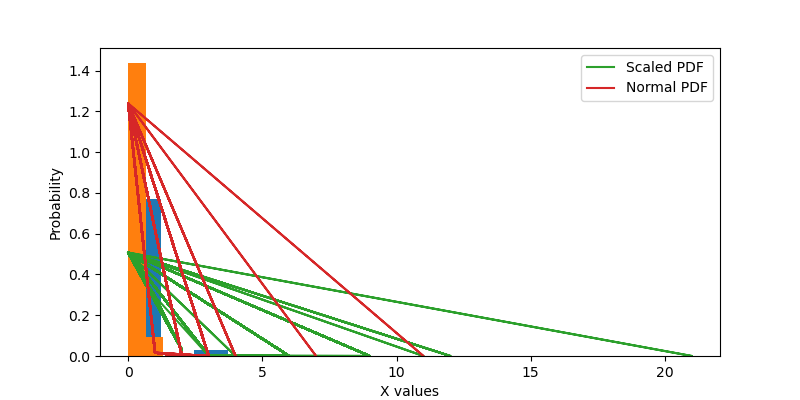

Now Testing: look
*------------------------------------------------------------------*
Scaled PDF: 0.26643321935483394 | Normal PDF: 0.6412214036045517


<IPython.core.display.Javascript object>


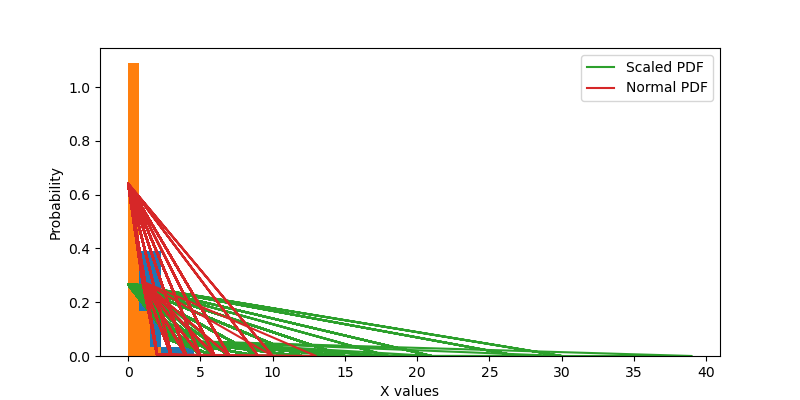

Now Testing: lot
*------------------------------------------------------------------*
Scaled PDF: 0.40829061010278583 | Normal PDF: 1.0418794449081452


<IPython.core.display.Javascript object>


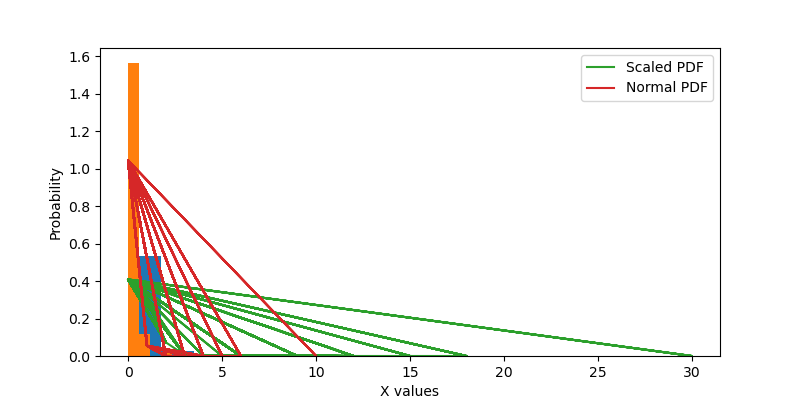

Now Testing: love
*------------------------------------------------------------------*
Scaled PDF: 0.25785049964792084 | Normal PDF: 0.692978893515644


<IPython.core.display.Javascript object>


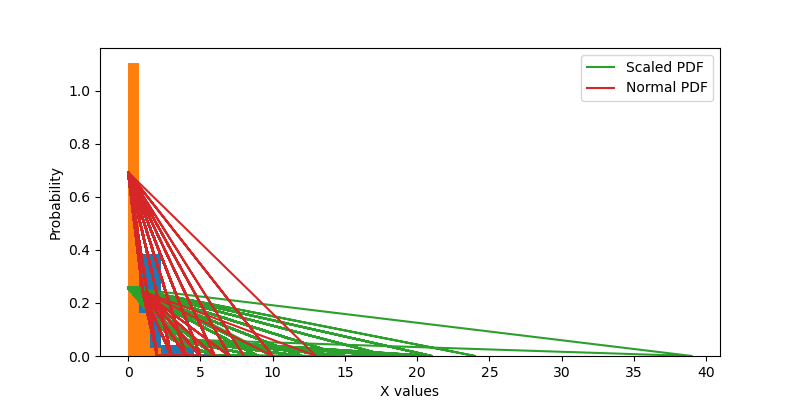

Now Testing: made
*------------------------------------------------------------------*
Scaled PDF: 0.494083633463734 | Normal PDF: 1.095849107166834


<IPython.core.display.Javascript object>


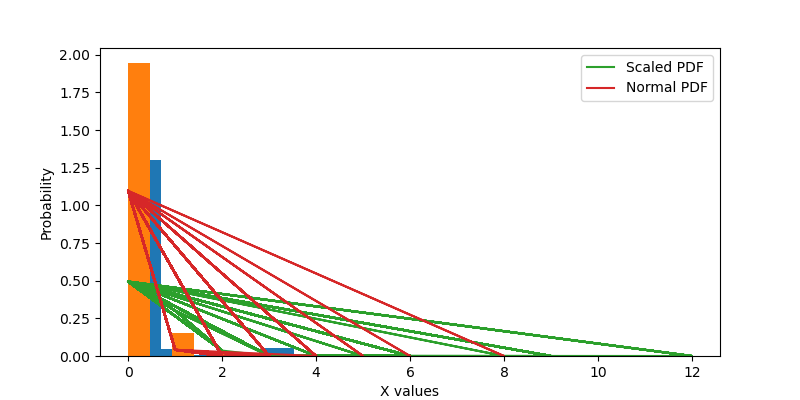

Now Testing: make
*------------------------------------------------------------------*
Scaled PDF: 0.2537646638618405 | Normal PDF: 0.6071823969120934


<IPython.core.display.Javascript object>


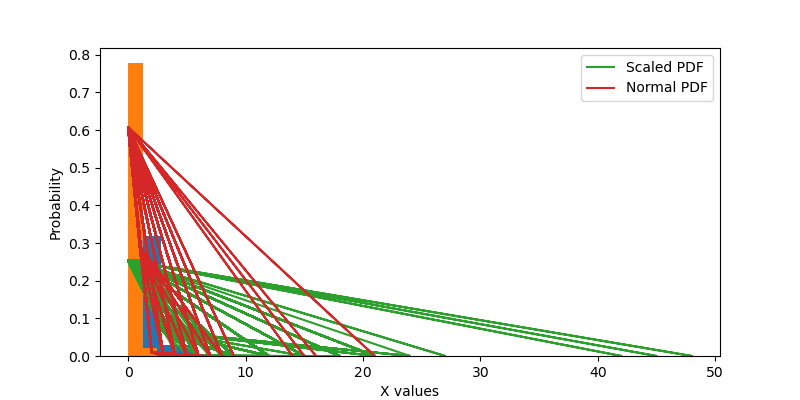

Now Testing: mani
*------------------------------------------------------------------*
Scaled PDF: 0.37696938577450056 | Normal PDF: 0.9073044818484979


<IPython.core.display.Javascript object>


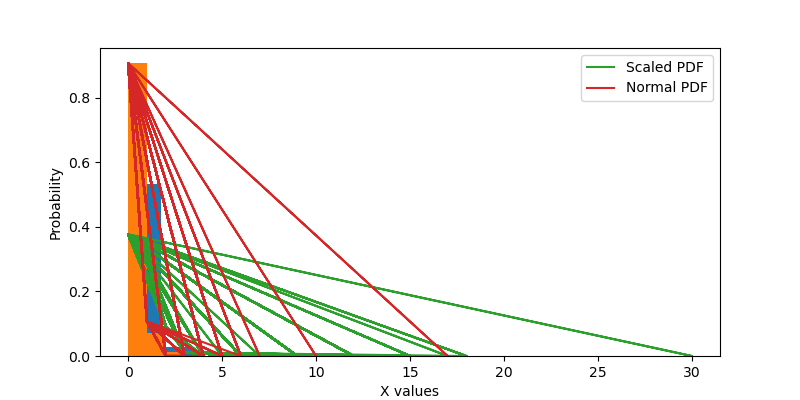

Now Testing: may
*------------------------------------------------------------------*
Scaled PDF: 0.5216835803243145 | Normal PDF: 1.2844682028686212


<IPython.core.display.Javascript object>


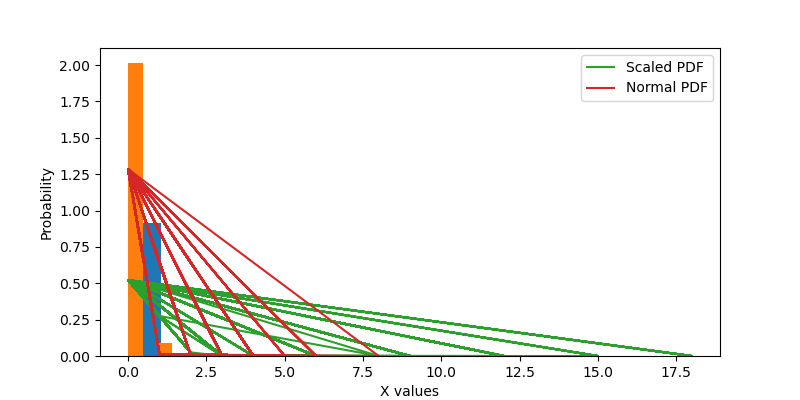

Now Testing: money
*------------------------------------------------------------------*
Scaled PDF: 0.6296882689223533 | Normal PDF: 1.153835501977205


<IPython.core.display.Javascript object>


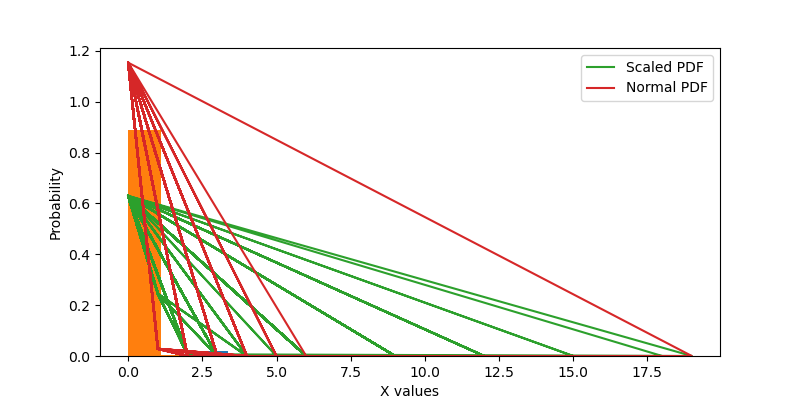

Now Testing: month
*------------------------------------------------------------------*
Scaled PDF: 0.5059267028315279 | Normal PDF: 1.079223036191588


<IPython.core.display.Javascript object>


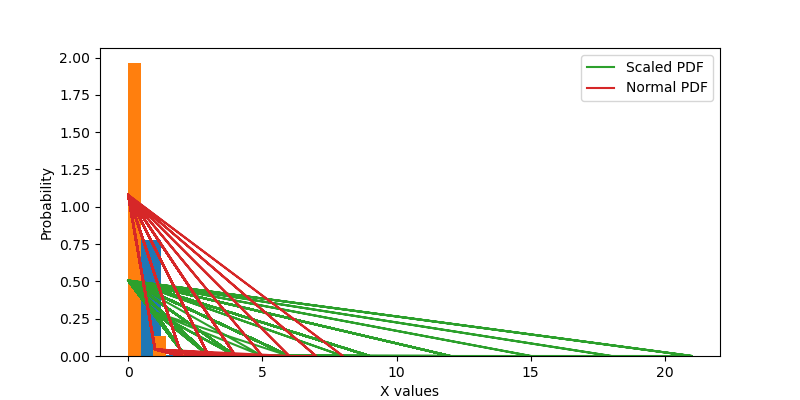

Now Testing: much
*------------------------------------------------------------------*
Scaled PDF: 0.30676441805751126 | Normal PDF: 0.7282411818518396


<IPython.core.display.Javascript object>


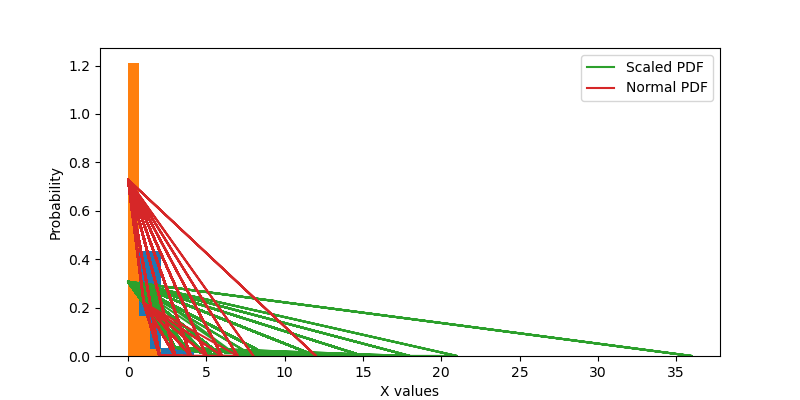

Now Testing: need
*------------------------------------------------------------------*
Scaled PDF: 0.34580266266574 | Normal PDF: 0.8431127514352517


<IPython.core.display.Javascript object>


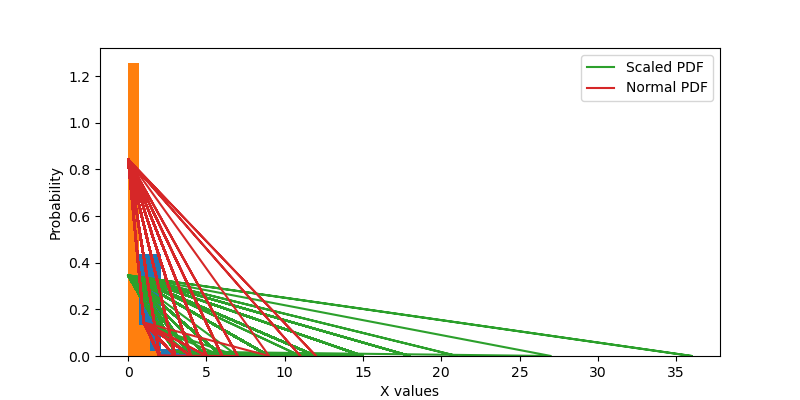

Now Testing: never
*------------------------------------------------------------------*
Scaled PDF: 0.4667477170949086 | Normal PDF: 1.0309070624881929


<IPython.core.display.Javascript object>


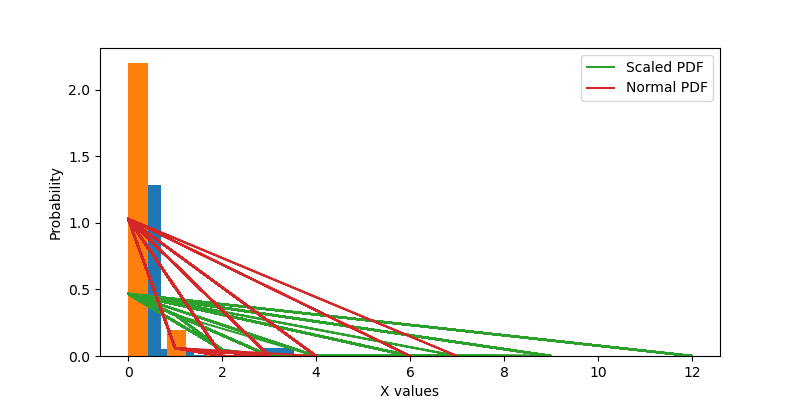

Now Testing: new
*------------------------------------------------------------------*
Scaled PDF: 0.31544483706300863 | Normal PDF: 0.7698329207856288


<IPython.core.display.Javascript object>


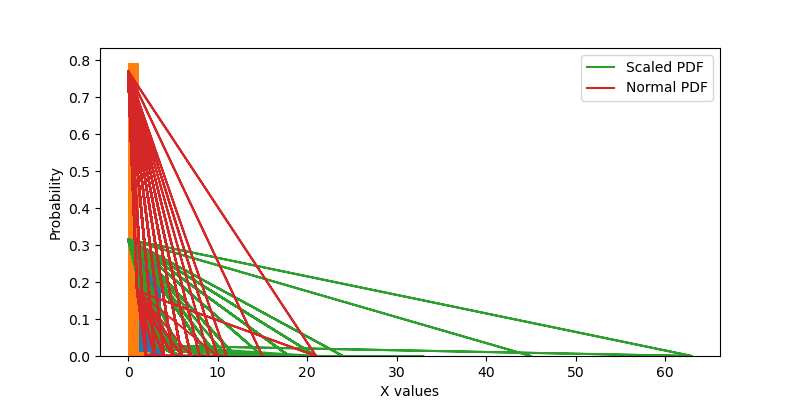

Now Testing: nice
*------------------------------------------------------------------*
Scaled PDF: 0.4164129347789773 | Normal PDF: 1.1098932369998677


<IPython.core.display.Javascript object>


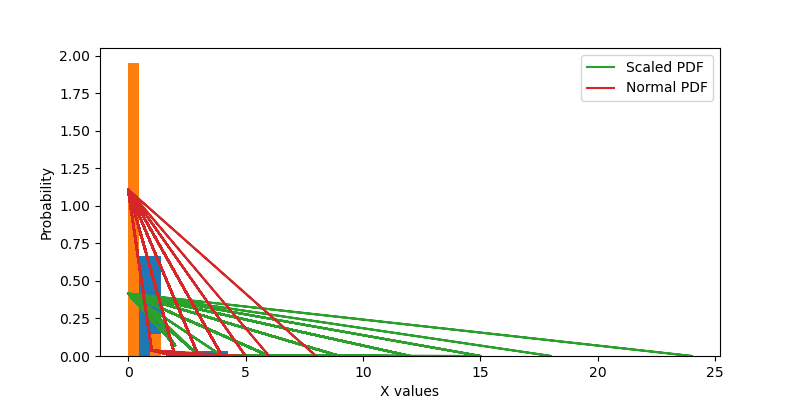

Now Testing: old
*------------------------------------------------------------------*
Scaled PDF: 0.4764682482749617 | Normal PDF: 1.1322931883178797


<IPython.core.display.Javascript object>


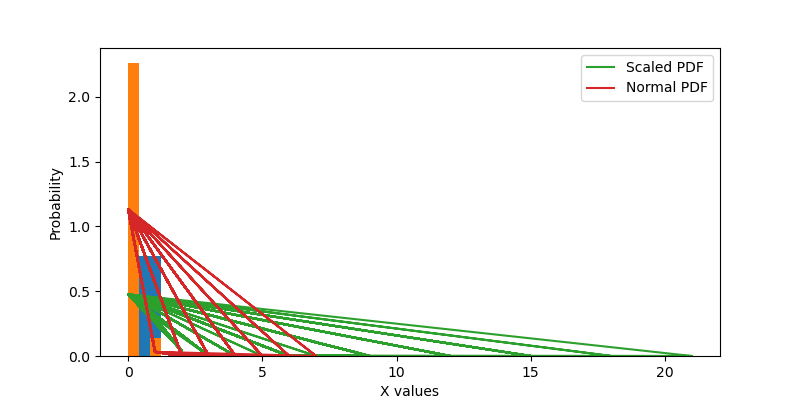

Now Testing: one
*------------------------------------------------------------------*
Scaled PDF: 0.1680481951897905 | Normal PDF: 0.36068785403213405


<IPython.core.display.Javascript object>


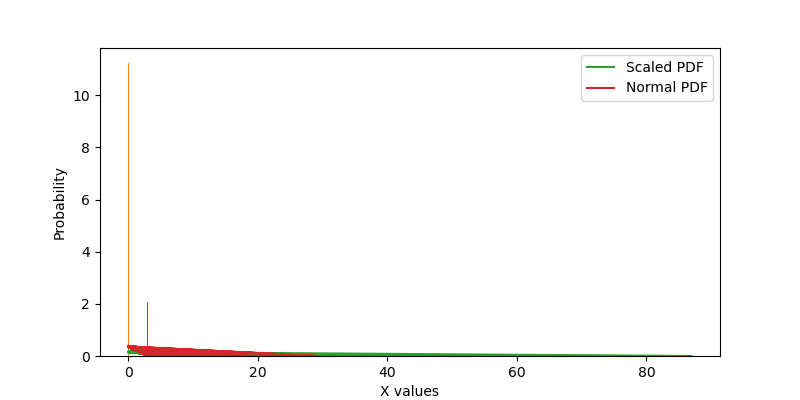

Now Testing: order
*------------------------------------------------------------------*
Scaled PDF: 0.4711602923390373 | Normal PDF: 1.0011401313353614


<IPython.core.display.Javascript object>


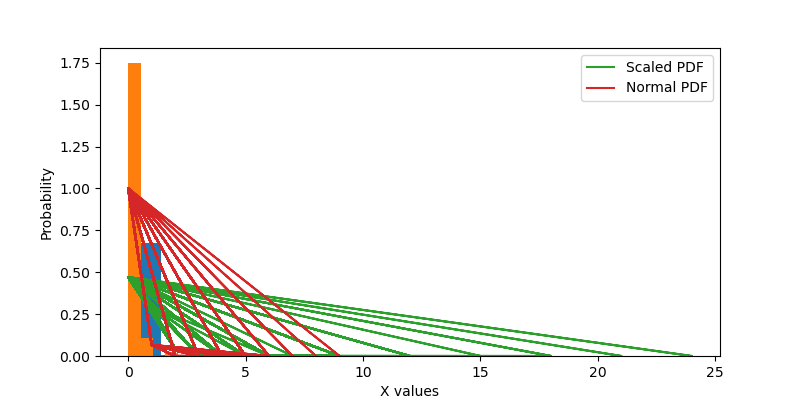

Now Testing: part
*------------------------------------------------------------------*
Scaled PDF: 0.538995375699114 | Normal PDF: 1.2430748601705048


<IPython.core.display.Javascript object>


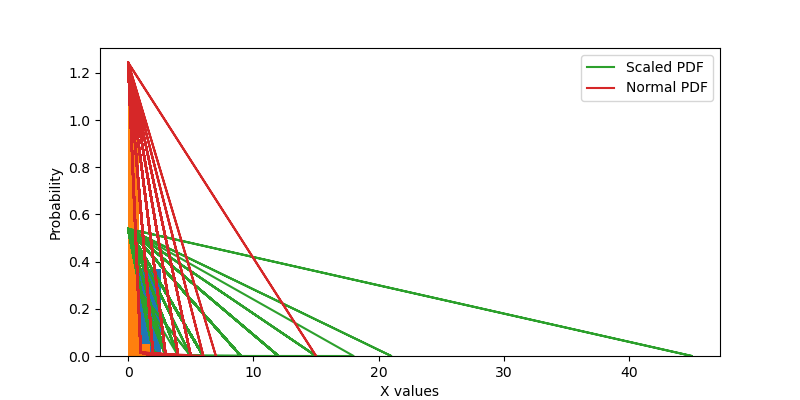

Now Testing: peopl
*------------------------------------------------------------------*
Scaled PDF: 0.40917374796490974 | Normal PDF: 0.904348377066648


<IPython.core.display.Javascript object>


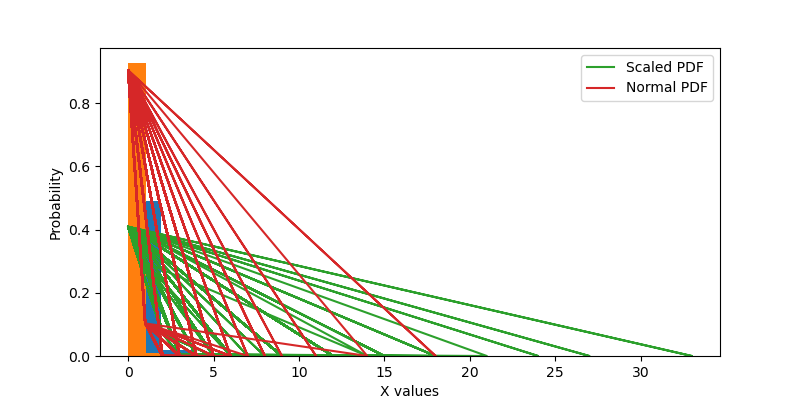

Now Testing: perfect
*------------------------------------------------------------------*
Scaled PDF: 0.48818188109864574 | Normal PDF: 1.3637822305793093


<IPython.core.display.Javascript object>


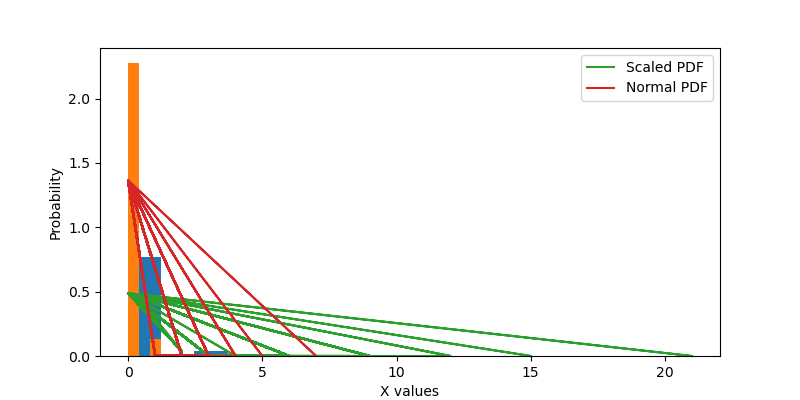

Now Testing: play
*------------------------------------------------------------------*
Scaled PDF: 0.2819006179420844 | Normal PDF: 0.710416198395662


<IPython.core.display.Javascript object>


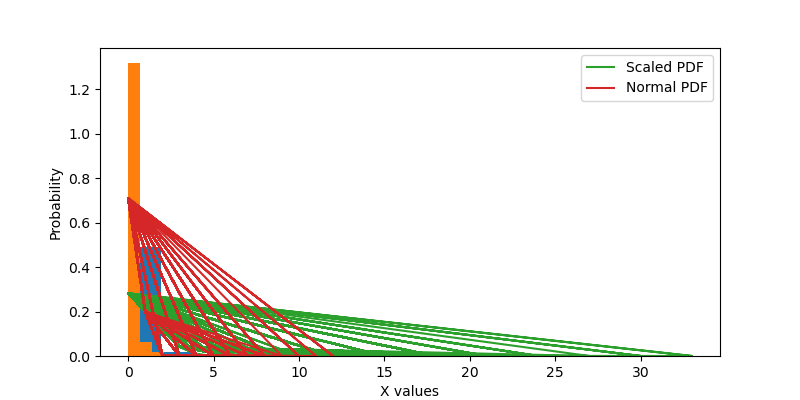

Now Testing: pretti
*------------------------------------------------------------------*
Scaled PDF: 0.5419730309453353 | Normal PDF: 1.3582832745416196


<IPython.core.display.Javascript object>


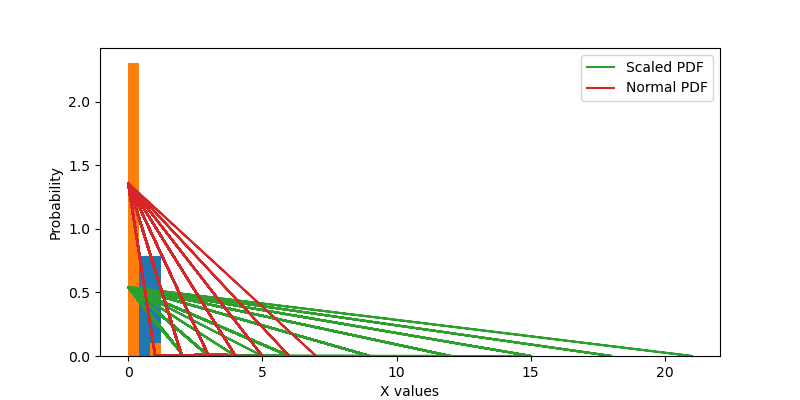

Now Testing: price
*------------------------------------------------------------------*
Scaled PDF: 0.40398499326710097 | Normal PDF: 1.0461851196448957


<IPython.core.display.Javascript object>


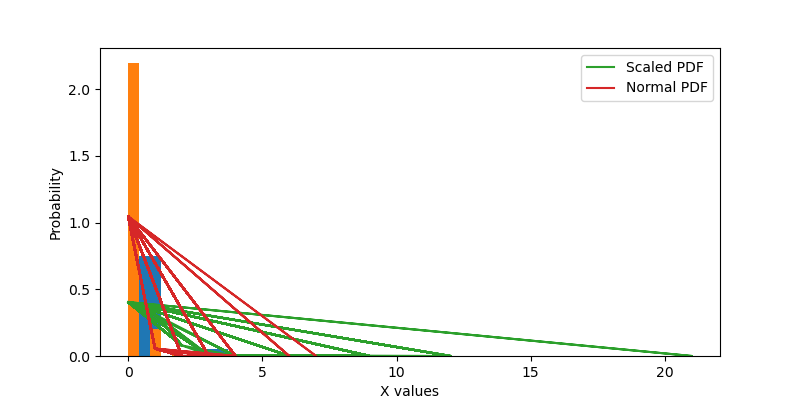

Now Testing: problem
*------------------------------------------------------------------*
Scaled PDF: 0.4125528849617608 | Normal PDF: 0.8859423074537892


<IPython.core.display.Javascript object>


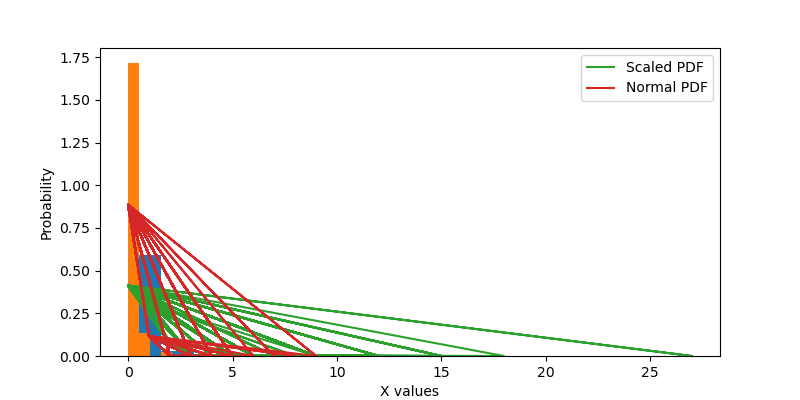

Now Testing: product
*------------------------------------------------------------------*
Scaled PDF: 0.2501579452694188 | Normal PDF: 0.542420350839111


<IPython.core.display.Javascript object>


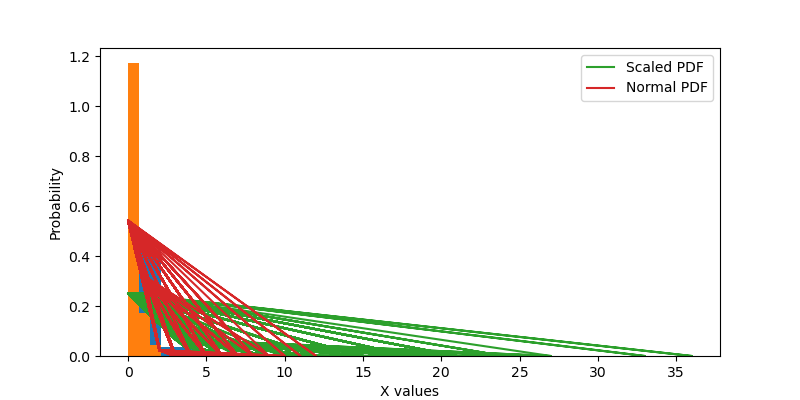

Now Testing: purchas
*------------------------------------------------------------------*
Scaled PDF: 0.43138143070357643 | Normal PDF: 0.9742295607375986


<IPython.core.display.Javascript object>


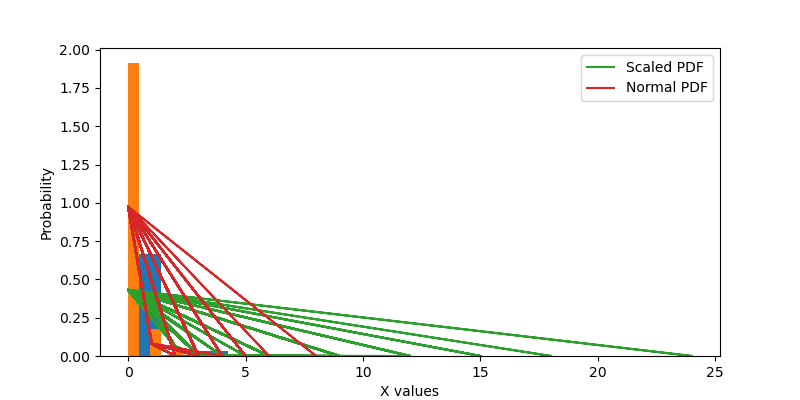

Now Testing: put
*------------------------------------------------------------------*
Scaled PDF: 0.4499051584273481 | Normal PDF: 1.0675245974322882


<IPython.core.display.Javascript object>


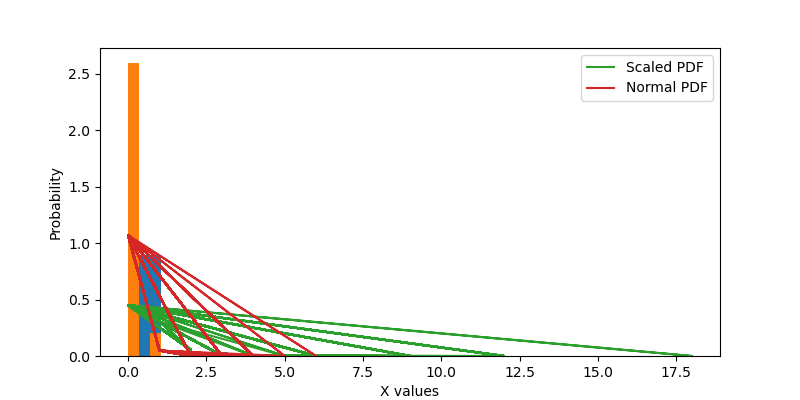

Now Testing: qualiti
*------------------------------------------------------------------*
Scaled PDF: 0.4158809121266978 | Normal PDF: 0.9835660469025581


<IPython.core.display.Javascript object>


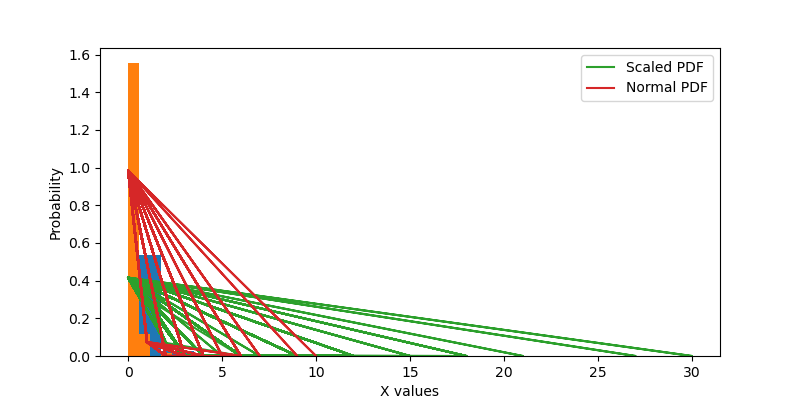

Now Testing: read
*------------------------------------------------------------------*
Scaled PDF: 0.3281352627441018 | Normal PDF: 0.7358787824529341


<IPython.core.display.Javascript object>


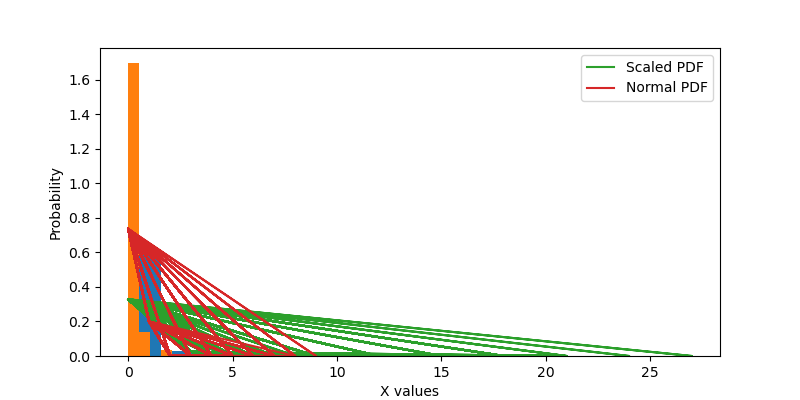

Now Testing: realli
*------------------------------------------------------------------*
Scaled PDF: 0.26990105728416147 | Normal PDF: 0.6672560744017036


<IPython.core.display.Javascript object>


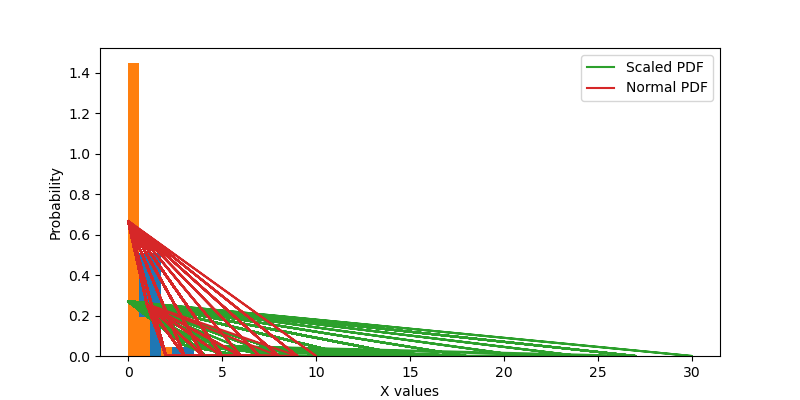

Now Testing: receiv
*------------------------------------------------------------------*
Scaled PDF: 0.6734786726386515 | Normal PDF: 1.285342799450756


<IPython.core.display.Javascript object>


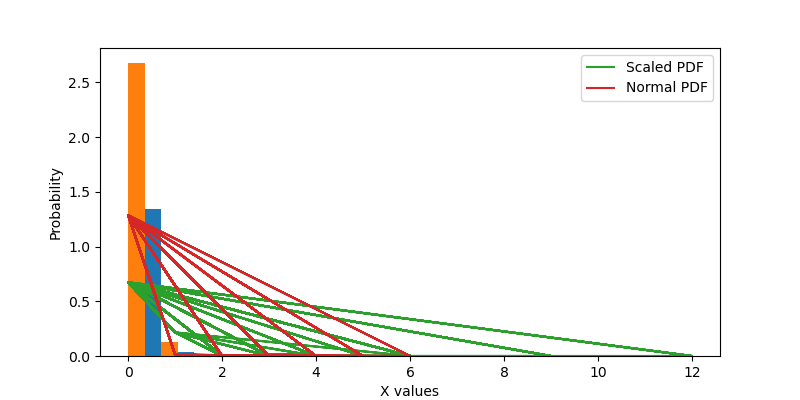

Now Testing: recommend
*------------------------------------------------------------------*
Scaled PDF: 0.4324459501391409 | Normal PDF: 1.1144677367392108


<IPython.core.display.Javascript object>


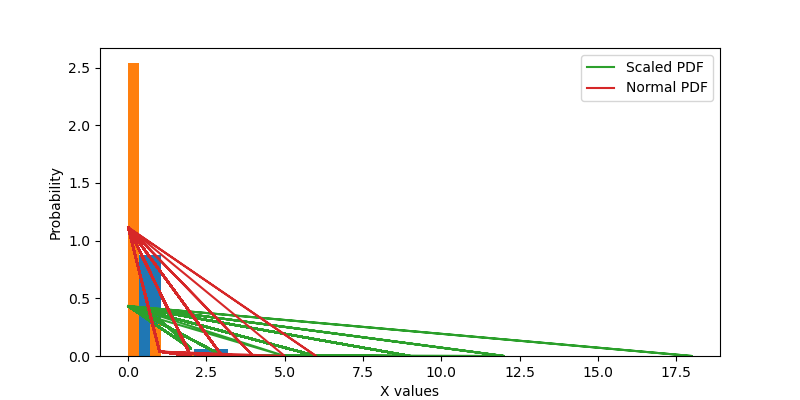

Now Testing: return
*------------------------------------------------------------------*
Scaled PDF: 0.7744185779935959 | Normal PDF: 1.2860332474563434


<IPython.core.display.Javascript object>


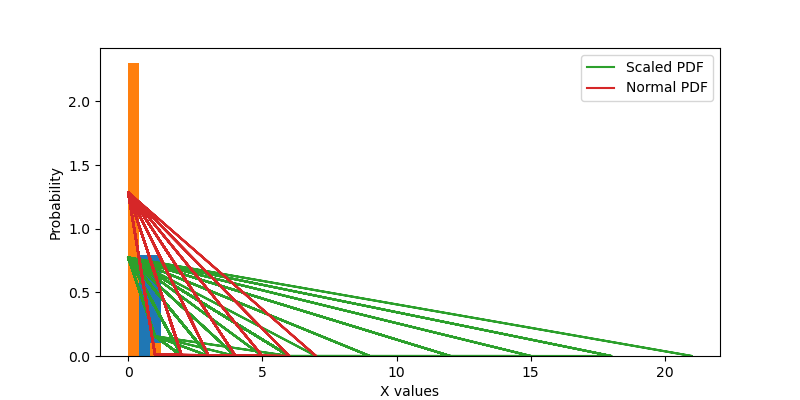

Now Testing: review
*------------------------------------------------------------------*
Scaled PDF: 0.4048327394261814 | Normal PDF: 0.8660504312670533


<IPython.core.display.Javascript object>


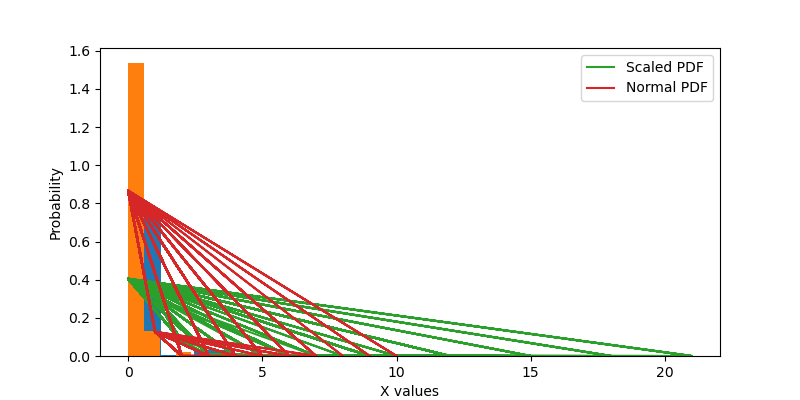

Now Testing: right
*------------------------------------------------------------------*
Scaled PDF: 0.4977892571677025 | Normal PDF: 1.1823464725937902


<IPython.core.display.Javascript object>


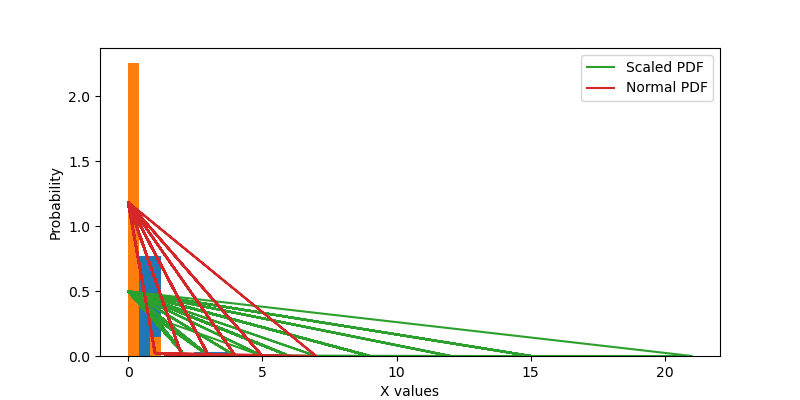

Now Testing: say
*------------------------------------------------------------------*
Scaled PDF: 0.4030267125656669 | Normal PDF: 0.8883597862072585


<IPython.core.display.Javascript object>


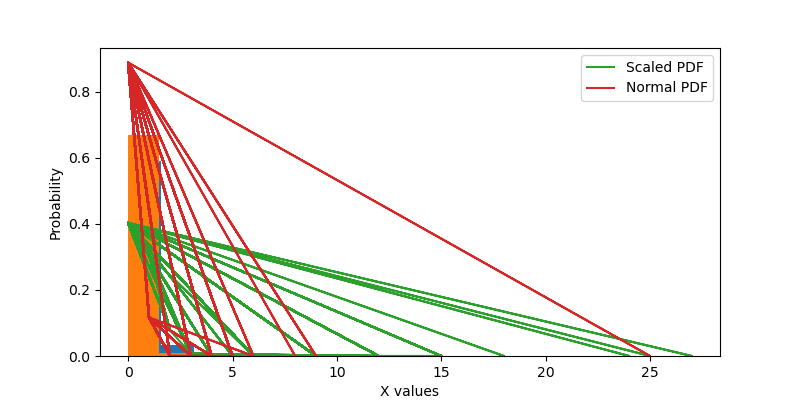

Now Testing: see
*------------------------------------------------------------------*
Scaled PDF: 0.4016970310000809 | Normal PDF: 0.9258132297872579


<IPython.core.display.Javascript object>


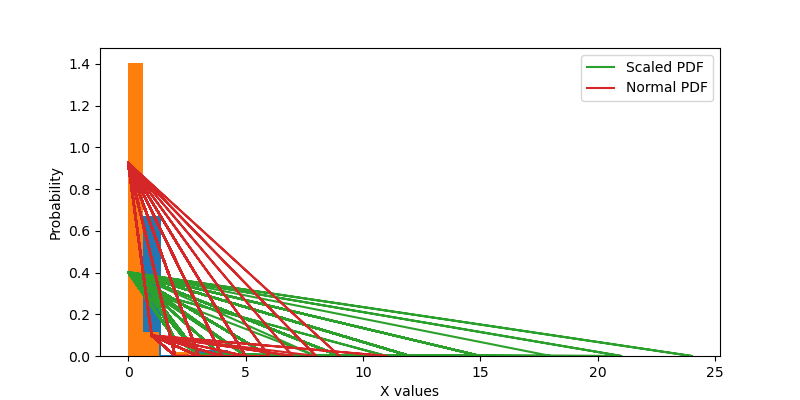

Now Testing: seem
*------------------------------------------------------------------*
Scaled PDF: 0.4323672205885707 | Normal PDF: 0.9471833021456209


<IPython.core.display.Javascript object>


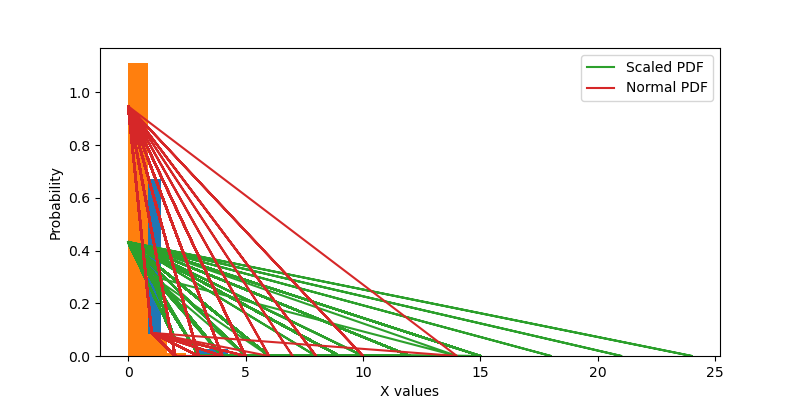

Now Testing: set
*------------------------------------------------------------------*
Scaled PDF: 0.3651630612747951 | Normal PDF: 0.8837179561672301


<IPython.core.display.Javascript object>


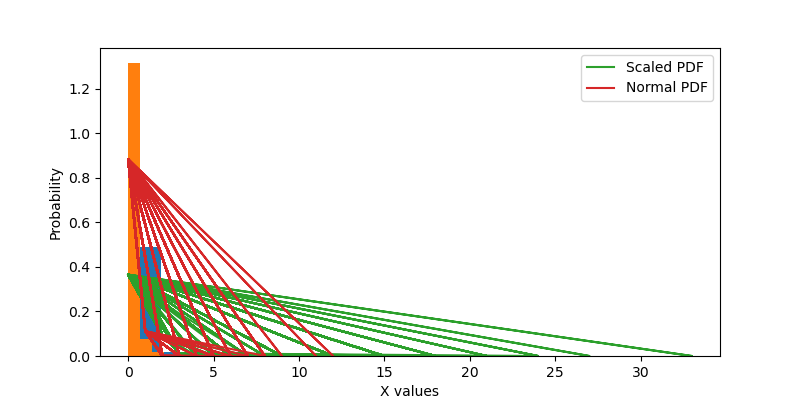

Now Testing: sinc
*------------------------------------------------------------------*
Scaled PDF: 0.5082582831244126 | Normal PDF: 1.2228562761558388


<IPython.core.display.Javascript object>


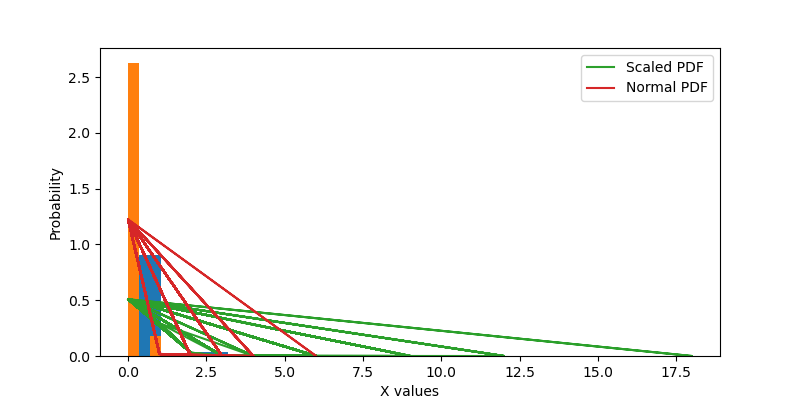

Now Testing: small
*------------------------------------------------------------------*
Scaled PDF: 0.527524320941096 | Normal PDF: 1.2665780635496438


<IPython.core.display.Javascript object>


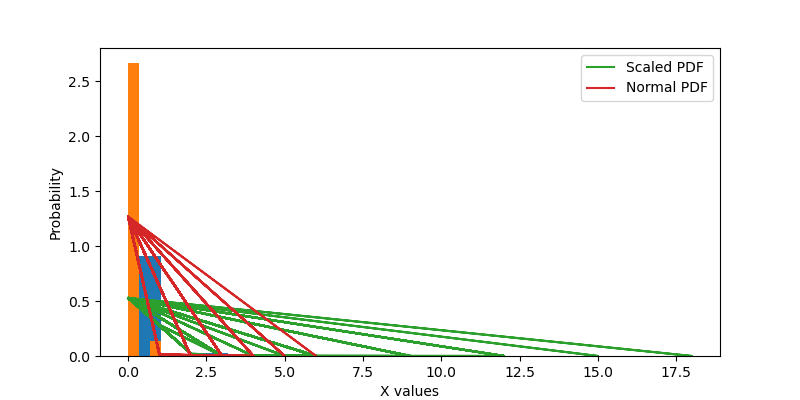

Now Testing: someth
*------------------------------------------------------------------*
Scaled PDF: 0.5805921308406655 | Normal PDF: 1.2640868334107969


<IPython.core.display.Javascript object>


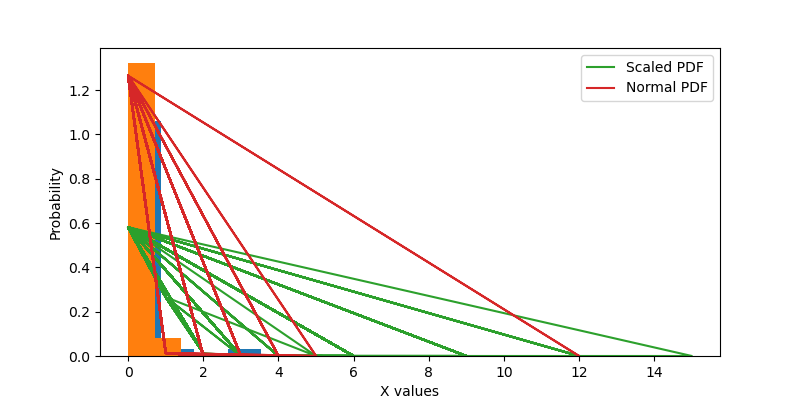

Now Testing: sound
*------------------------------------------------------------------*
Scaled PDF: 0.4017046147622572 | Normal PDF: 0.9492740149013924


<IPython.core.display.Javascript object>


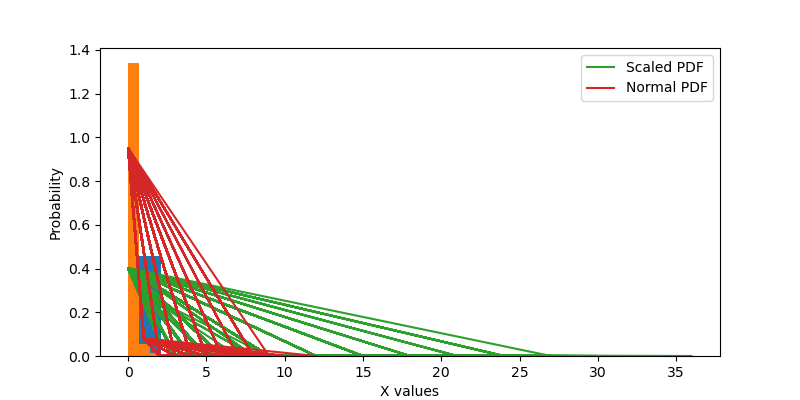

Now Testing: star
*------------------------------------------------------------------*
Scaled PDF: 0.4364563750630463 | Normal PDF: 1.0815897593698522


<IPython.core.display.Javascript object>


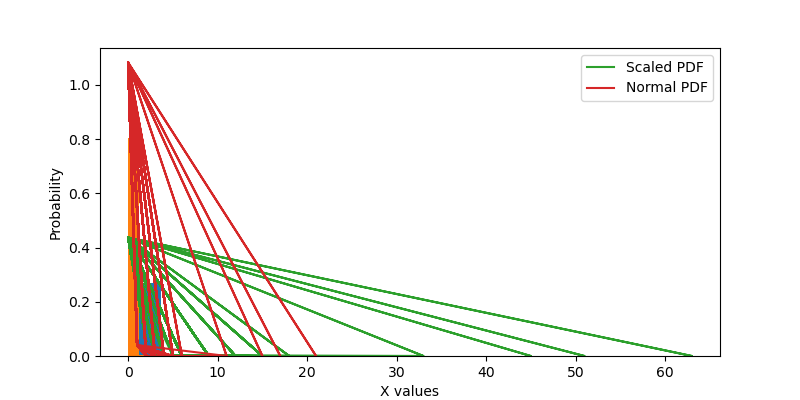

Now Testing: start
*------------------------------------------------------------------*
Scaled PDF: 0.5141471524161596 | Normal PDF: 1.1592755974349904


<IPython.core.display.Javascript object>


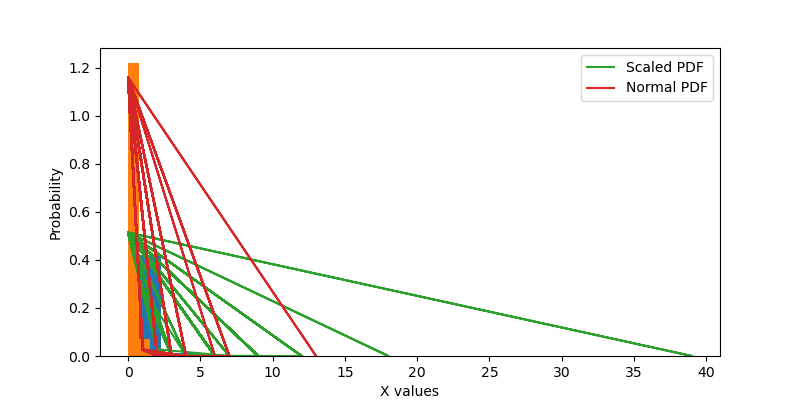

Now Testing: still
*------------------------------------------------------------------*
Scaled PDF: 0.3691572314112662 | Normal PDF: 0.8990116415521124


<IPython.core.display.Javascript object>


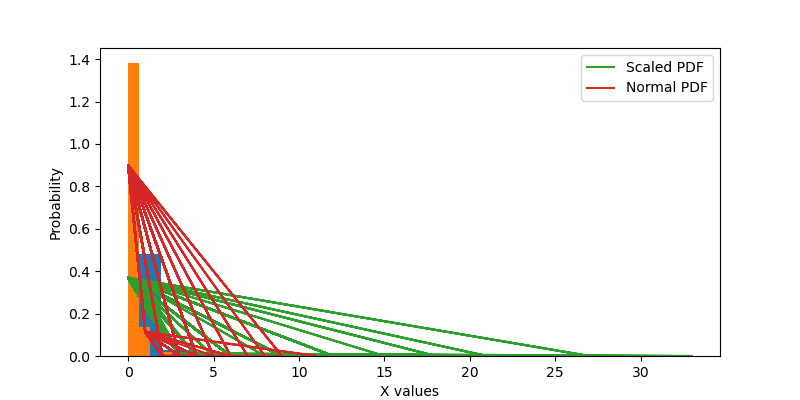

Now Testing: sure
*------------------------------------------------------------------*
Scaled PDF: 0.6359562489218372 | Normal PDF: 1.4917389209171021


<IPython.core.display.Javascript object>


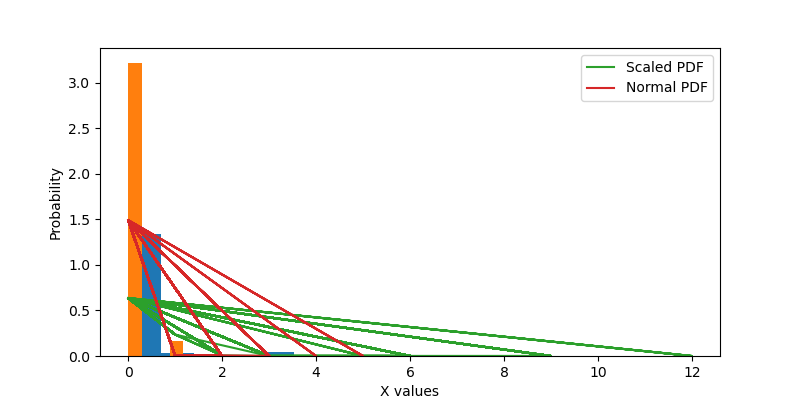

Now Testing: take
*------------------------------------------------------------------*
Scaled PDF: 0.3545704355403732 | Normal PDF: 0.8364324494061356


<IPython.core.display.Javascript object>


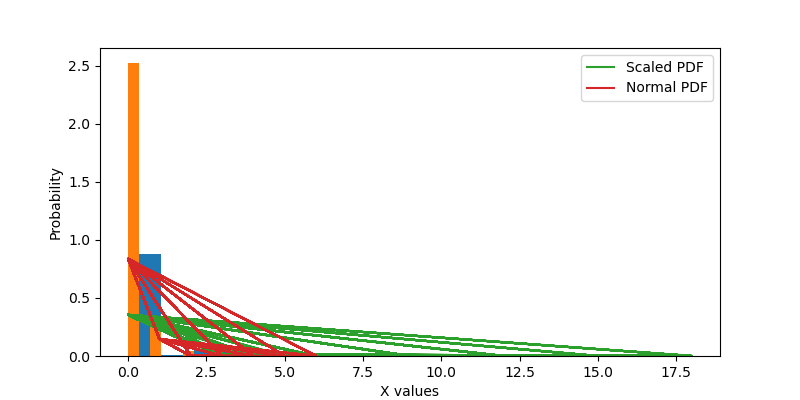

Now Testing: thing
*------------------------------------------------------------------*
Scaled PDF: 0.3383809308126247 | Normal PDF: 0.7774219776974508


<IPython.core.display.Javascript object>


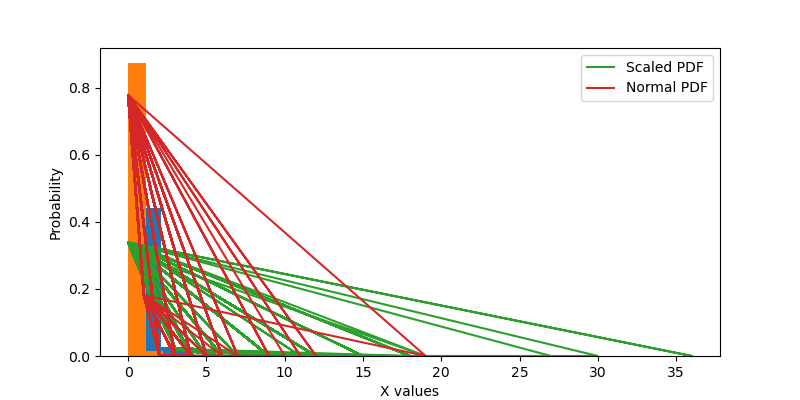

Now Testing: think
*------------------------------------------------------------------*
Scaled PDF: 0.3867125061156888 | Normal PDF: 0.8762679905071274


<IPython.core.display.Javascript object>


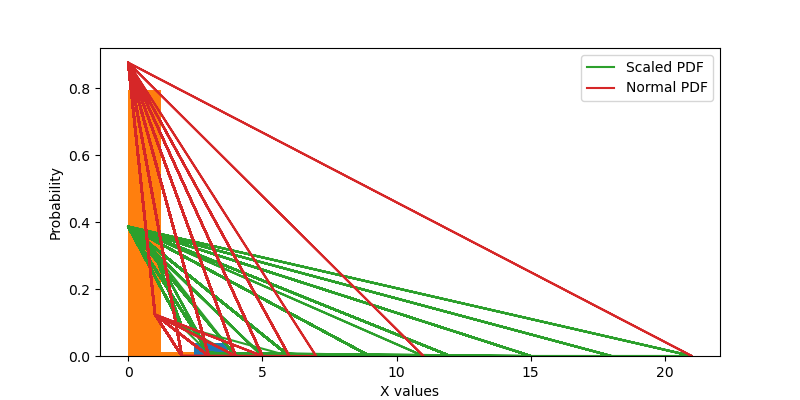

Now Testing: though
*------------------------------------------------------------------*
Scaled PDF: 0.5168076902860281 | Normal PDF: 1.2586800620869378


<IPython.core.display.Javascript object>


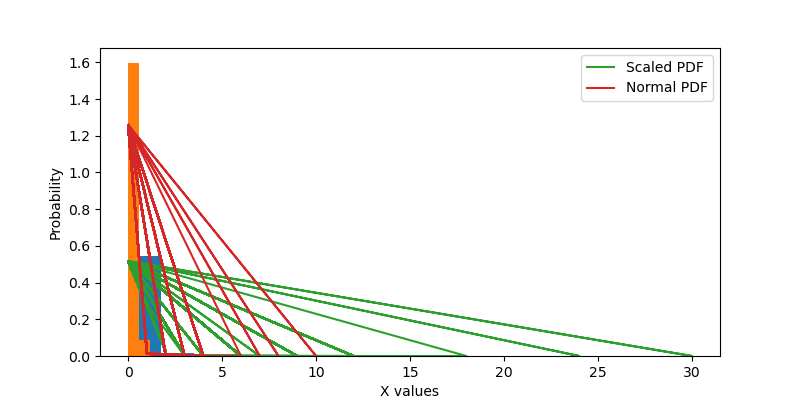

Now Testing: thought
*------------------------------------------------------------------*
Scaled PDF: 0.6847120742920089 | Normal PDF: 1.4398066750060121


<IPython.core.display.Javascript object>


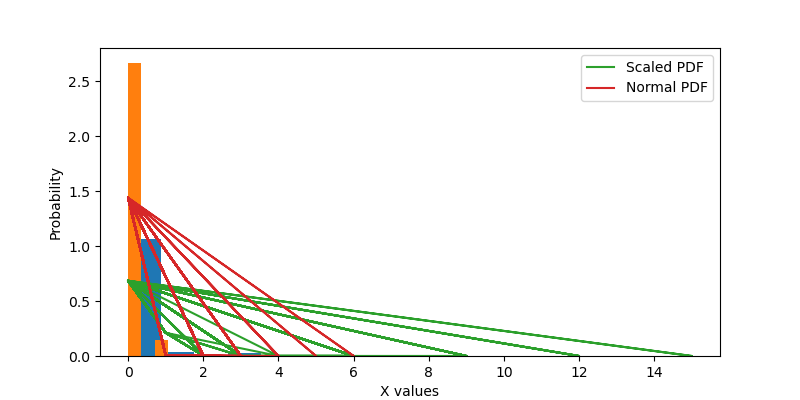

Now Testing: time
*------------------------------------------------------------------*
Scaled PDF: 0.21747406206346867 | Normal PDF: 0.4776661602909043


<IPython.core.display.Javascript object>


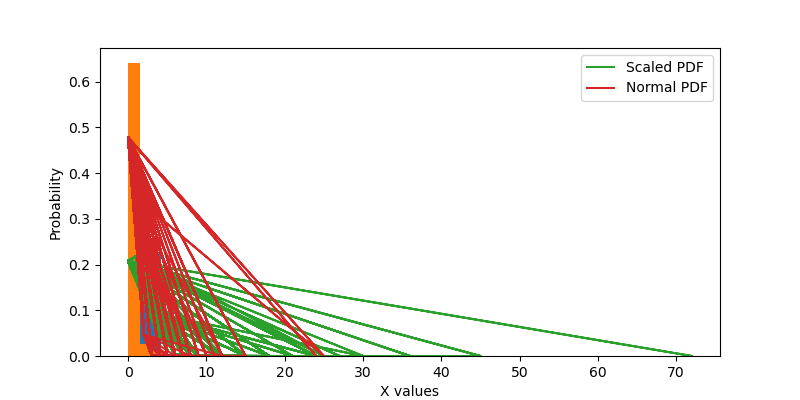

Now Testing: tri
*------------------------------------------------------------------*
Scaled PDF: 0.35650359410173443 | Normal PDF: 0.7636519560860308


<IPython.core.display.Javascript object>


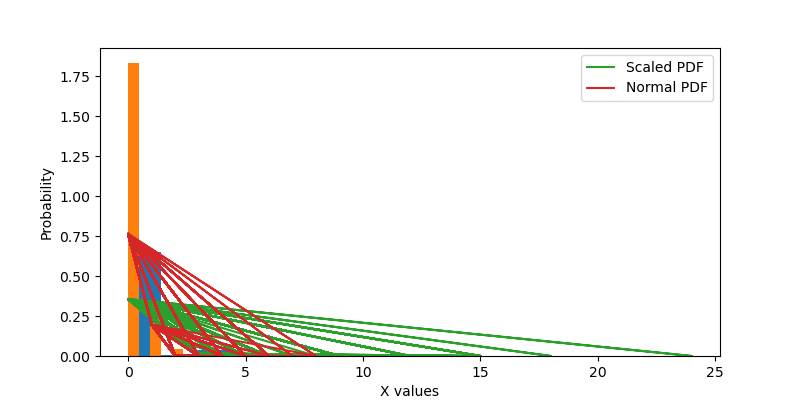

Now Testing: turn
*------------------------------------------------------------------*
Scaled PDF: 0.5888577490833166 | Normal PDF: 1.2879677816147914


<IPython.core.display.Javascript object>


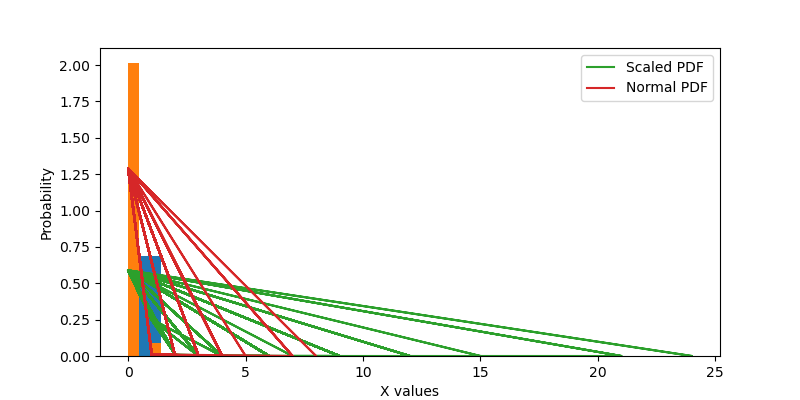

Now Testing: two
*------------------------------------------------------------------*
Scaled PDF: 0.3691869726109387 | Normal PDF: 0.8799236553898143


<IPython.core.display.Javascript object>


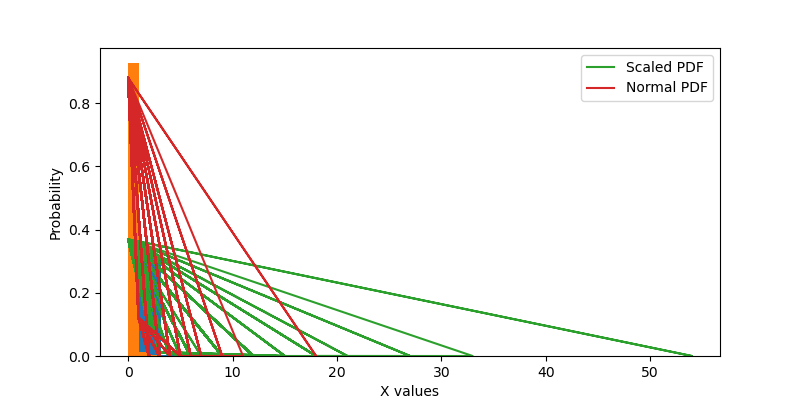

Now Testing: use
*------------------------------------------------------------------*
Scaled PDF: 0.16119488779657326 | Normal PDF: 0.35954345425076695


<IPython.core.display.Javascript object>


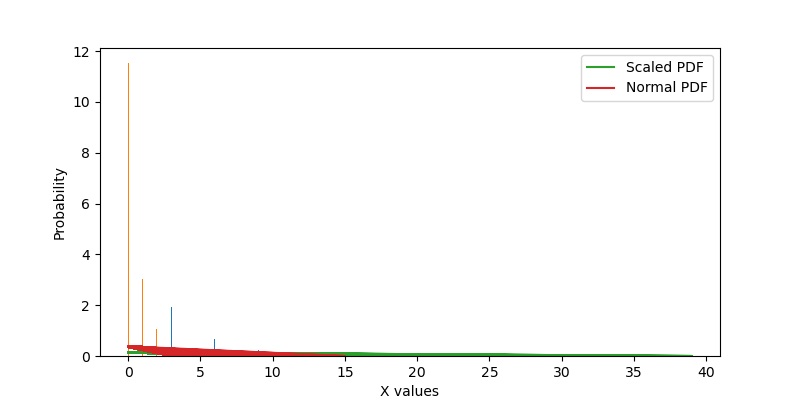

Now Testing: want
*------------------------------------------------------------------*
Scaled PDF: 0.3350423070286229 | Normal PDF: 0.7832741765918626


<IPython.core.display.Javascript object>


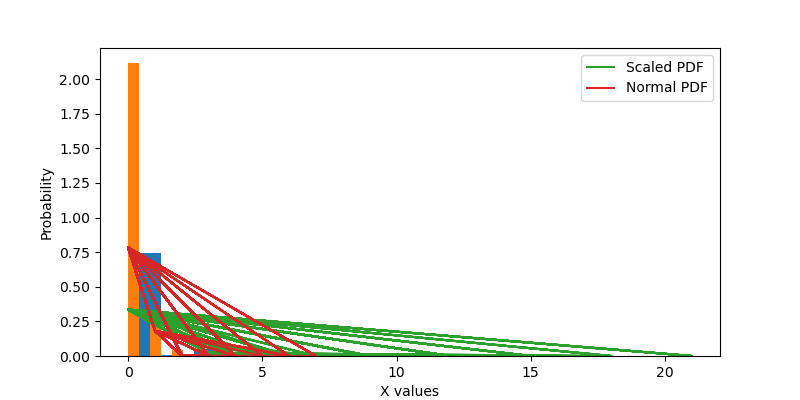

Now Testing: way
*------------------------------------------------------------------*
Scaled PDF: 0.3703204371575676 | Normal PDF: 0.8586645782582154


<IPython.core.display.Javascript object>


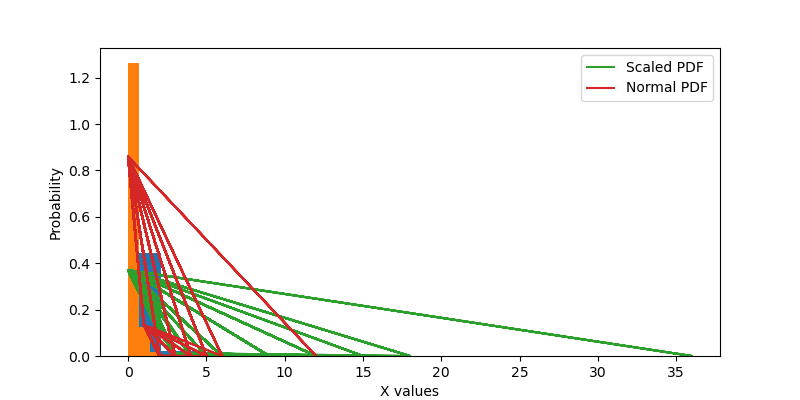

Now Testing: week
*------------------------------------------------------------------*
Scaled PDF: 0.5664852149704772 | Normal PDF: 1.2048313292280857


<IPython.core.display.Javascript object>


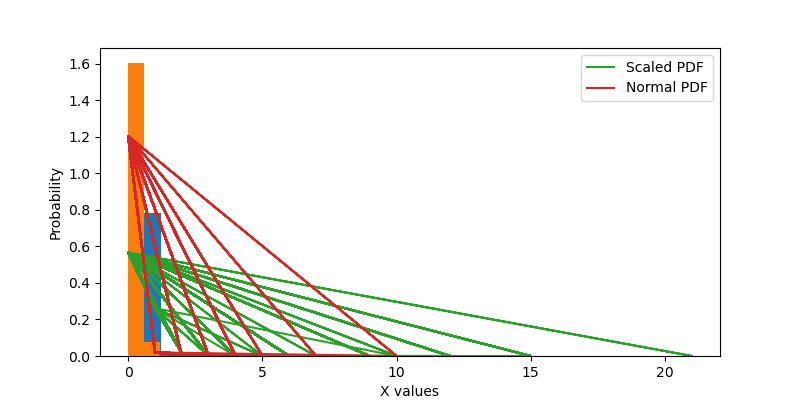

Now Testing: well
*------------------------------------------------------------------*
Scaled PDF: 0.2800143987884925 | Normal PDF: 0.7102745567895015


<IPython.core.display.Javascript object>


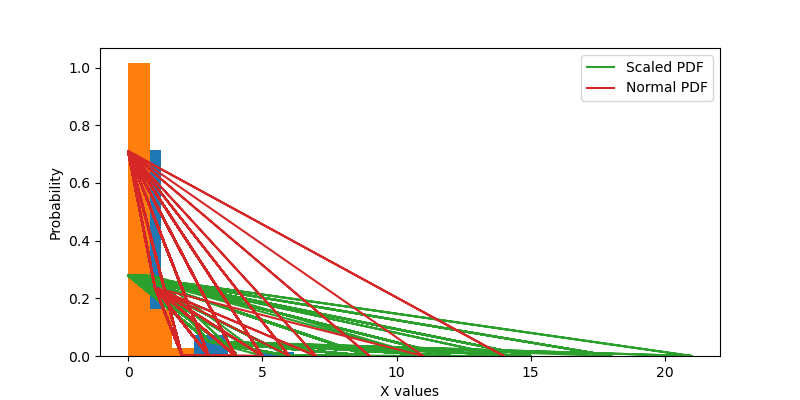

Now Testing: without
*------------------------------------------------------------------*
Scaled PDF: 0.504280458159664 | Normal PDF: 1.2460786043385463


<IPython.core.display.Javascript object>


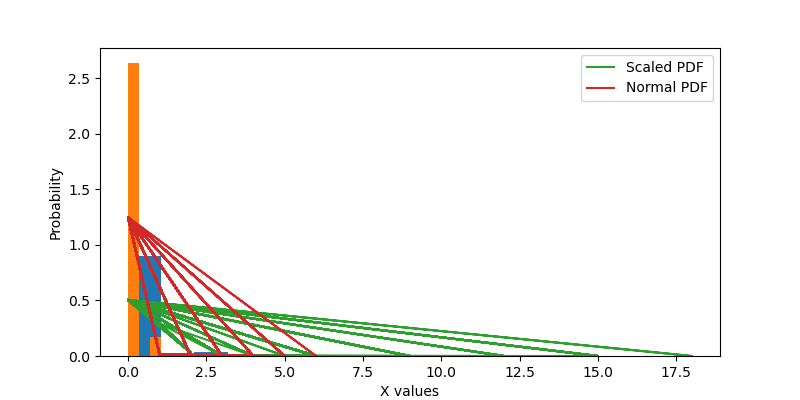

Now Testing: work
*------------------------------------------------------------------*
Scaled PDF: 0.25386855245675677 | Normal PDF: 0.5448141453256137


<IPython.core.display.Javascript object>


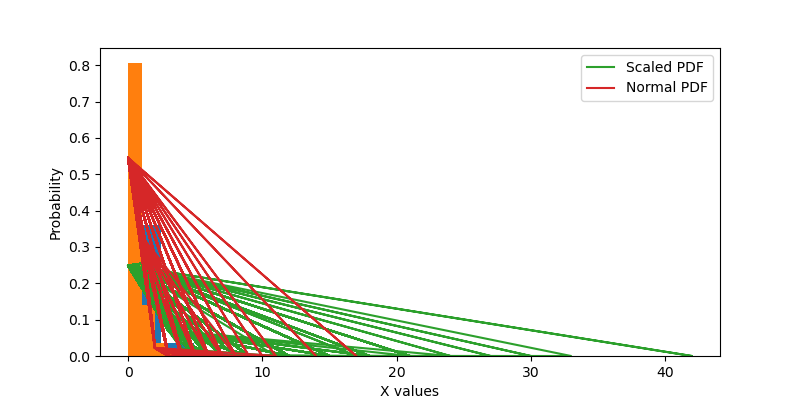

Now Testing: worth
*------------------------------------------------------------------*
Scaled PDF: 0.6207273149030286 | Normal PDF: 1.500424375872966


<IPython.core.display.Javascript object>


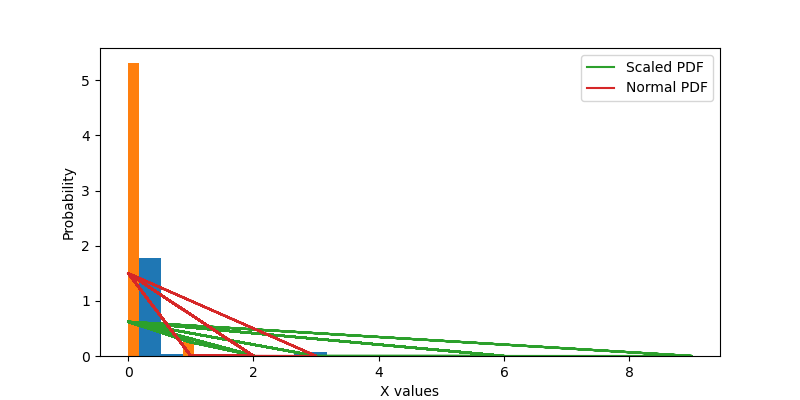

Now Testing: would
*------------------------------------------------------------------*
Scaled PDF: 0.2531748604002964 | Normal PDF: 0.5188085628933172


<IPython.core.display.Javascript object>


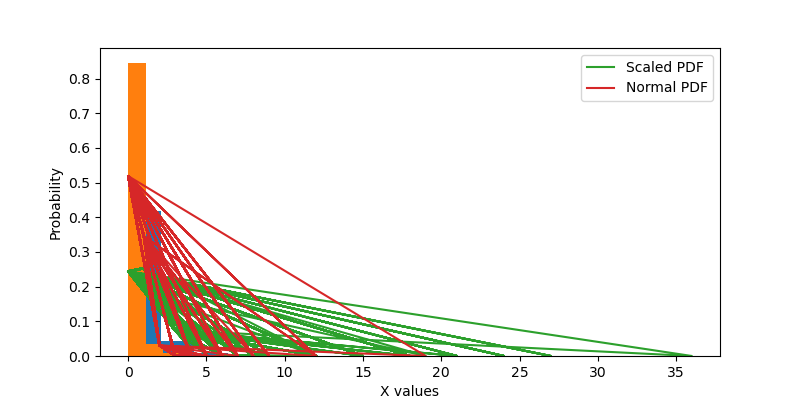

Now Testing: year
*------------------------------------------------------------------*
Scaled PDF: 0.31294233018953865 | Normal PDF: 0.7373880306454553


<IPython.core.display.Javascript object>


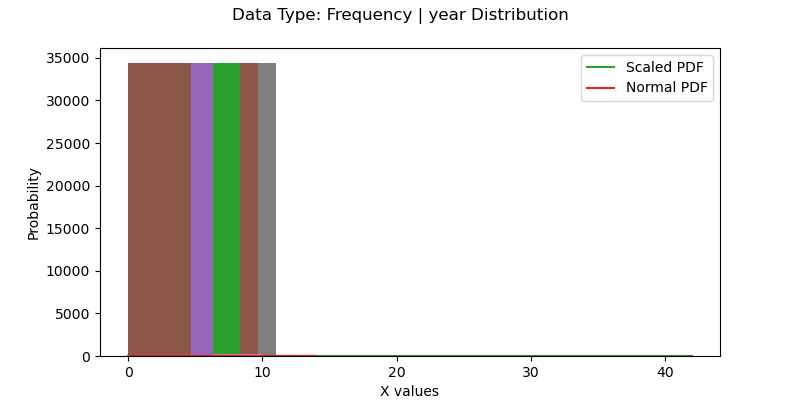

In [36]:
from scipy import stats
%matplotlib notebook

for col in pos_freq.columns:
    print("Now Testing: {}".format(str(col)))
    print("*------------------------------------------------------------------*")
    pm, pstd = stats.norm.fit(pos_freq[col].to_numpy(), loc=1)
    m, std = stats.norm.fit(freq[col].to_numpy(), loc=1)
    p_pdf_norm = stats.norm.pdf(pos_freq[col].to_numpy(), pm, pstd)
    pdf_norm = stats.norm.pdf(freq[col].to_numpy(), m, std)
    print("Scaled PDF: {} | Normal PDF: {}".format(np.max(p_pdf_norm), np.max(pdf_norm)))
    
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.hist(pos_freq[col].to_numpy(), bins='auto', density=True)
    ax.hist(freq[col].to_numpy(), bins='auto', density=True)
    ax.plot(pos_freq[col].to_numpy(), p_pdf_norm, label='Scaled PDF')
    ax.plot(freq[col].to_numpy(), pdf_norm, label='Normal PDF')
    ax.set_xlabel('X values')
    ax.set_ylabel('Probability')
    ax.legend();

In [37]:
for col in freq.columns:
    print("Now Testing: {}".format(str(col)))
    print("*------------------------------------------------------------------*")    
    pos_results = stats.kstest(pos_freq[col], 'norm')
    results = stats.kstest(freq[col], 'norm')
    
    print("Scaled Statistic: {} | Regular Statistic: {}".format(pos_results[0], results[0]))
    print("Scaled P Value: {} | Regular P Value: {}".format(pos_results[1], results[1]))

Now Testing: actual
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: also
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: alway
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: amazon
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: anoth
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: around
*------------------------------------------------------------------*
Scaled Statistic: 0.

Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: like
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: littl
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: long
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: look
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: lot
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: love
*------

Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: start
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: still
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: sure
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: take
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: thing
*------------------------------------------------------------------*
Scaled Statistic: 0.5 | Regular Statistic: 0.5
Scaled P Value: 0.0 | Regular P Value: 0.0
Now Testing: think
*--

In [38]:
from scipy.stats import norm

count_cdf = 0

for col in pos_freq.columns:
    print("Now Testing {}".format(str(col)))
    print("*----------------------------------------------------------------------*")
    mean = pos_freq[col].mean()
    std = pos_freq[col].std()
    ans = np.average(norm.cdf(pos_freq[col].to_numpy(), mean, std))
    
    x = freq[col].mean()
    y = freq[col].std()
    z = np.average(norm.cdf(freq[col].to_numpy(), x, y))    
    
    if(np.average(norm.cdf(pos_freq[col].to_numpy(), pos_freq[col].mean(), pos_freq[col].std())) > np.average(norm.cdf(freq[col].to_numpy(), freq[col].mean(), freq[col].std()))):
            count_cdf += 1
           

print()
print()
print("{} Columns out of {} Columns have a higher CDF in the scaled data".format(count_cdf, pos_freq.shape[1]))
    

Now Testing actual
*----------------------------------------------------------------------*
Now Testing also
*----------------------------------------------------------------------*
Now Testing alway
*----------------------------------------------------------------------*
Now Testing amazon
*----------------------------------------------------------------------*
Now Testing anoth
*----------------------------------------------------------------------*
Now Testing around
*----------------------------------------------------------------------*
Now Testing back
*----------------------------------------------------------------------*
Now Testing bad
*----------------------------------------------------------------------*
Now Testing best
*----------------------------------------------------------------------*
Now Testing better
*----------------------------------------------------------------------*
Now Testing big
*----------------------------------------------------------------------*
No

Now Testing set
*----------------------------------------------------------------------*
Now Testing sinc
*----------------------------------------------------------------------*
Now Testing small
*----------------------------------------------------------------------*
Now Testing someth
*----------------------------------------------------------------------*
Now Testing sound
*----------------------------------------------------------------------*
Now Testing star
*----------------------------------------------------------------------*
Now Testing start
*----------------------------------------------------------------------*
Now Testing still
*----------------------------------------------------------------------*
Now Testing sure
*----------------------------------------------------------------------*
Now Testing take
*----------------------------------------------------------------------*
Now Testing thing
*----------------------------------------------------------------------*
Now 

In [39]:
gc.collect()

30